## Automotive Surveillance.
**• OBJECTIVE**:

Design a DL based car identification model to identify the car's make, color, and number plate of a car moving on the road.

**• DATA DESCRIPTION:**

* The dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing images, where each class has been split roughly in a 50-50 split.


* Annotation consists of bounding box region for training images.


* Link to the dataset: https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder


**• Steps and Tasks:**

* Import the data

* Map training and testing images to its classes.

* Map training and testing images to its annotations.

*  Display images with bounding box
* Images mapped to its class and annotation ready to be used for deep learning


## Importing necessary packages

In [ ]:
# importing packages

import random
random.seed(0)

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

import os
import numpy as np
import pandas as pd
import cv2
import glob
from zipfile import ZipFile
import csv

#Graphs
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objects as go

#Tensorflow
import tensorflow as tf
from keras.layers import Dense, LeakyReLU, Dropout, Flatten,  Activation, BatchNormalization, GlobalAveragePooling2D
from keras.layers import UpSampling2D, Input, Concatenate, Reshape
from keras.layers import Conv2D, MaxPool2D, GlobalMaxPooling2D
from keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D

from keras.models import Model, Sequential
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.metrics import Recall, Precision
from keras import backend as K

from tensorflow.keras import optimizers
from tensorflow.keras.utils import to_categorical
#from tensorflow import keras
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad

from google.colab.patches import cv2_imshow
from keras.preprocessing.image import img_to_array

from keras.losses import binary_crossentropy
from keras.backend import log, epsilon

from mpl_toolkits.axes_grid1 import ImageGrid  # for printing multiple images

from sklearn.model_selection import train_test_split
# getting methods for confusion matrix, F1 score, Accuracy Score etc.
from sklearn.metrics import confusion_matrix, f1_score,accuracy_score, classification_report, make_scorer,recall_score
from sklearn import metrics


# for hyperparameter tuning and KFoldCV
#from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold
#from scipy.stats import randint as sp_randint
#from scipy.stats import uniform as sp_uniform

In [ ]:
from sklearn.decomposition import PCA as RandomizedPCA
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold
import math

from keras.preprocessing import image
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras.applications import MobileNetV2

from keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img
from keras.preprocessing import dataset_utils
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard

from tqdm import tqdm

In [ ]:
# RCNN

!pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# mounting google drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Clone DARKNET for implementing YOLOV3

!git clone https://github.com/pjreddie/darknet
!cd darknet
!make

## Step 1: Import the data

In [ ]:
#Set the paths

project_path = "/content/drive/My Drive/AIML/Capstone/"

annotation_path  = project_path+"Annotations/"
image_train_path = project_path+"car_images/Car Images/Train Images/"
image_test_path = project_path+"car_images/Car Images/Test Images/"

In [ ]:
# getting the annotations csv in dataframe

train_annotation = pd.read_csv(annotation_path +'Train Annotations.csv')
test_annotation = pd.read_csv(annotation_path+'Test Annotation.csv')

In [ ]:
print(train_annotation.columns)
print(test_annotation.columns)

Index(['Image Name', 'Bounding Box coordinates', 'Unnamed: 2', 'Unnamed: 3',
       'Unnamed: 4', 'Image class'],
      dtype='object')
Index(['Image Name', 'Bounding Box coordinates', 'Unnamed: 2', 'Unnamed: 3',
       'Unnamed: 4', 'Image class'],
      dtype='object')


In [ ]:
# function to rename columns of the annotations dataframes

def rename_columns(dataframe):
  dataframe.rename(columns={'Bounding Box coordinates': 'x0', 'Unnamed: 2': 'y0','Unnamed: 3': 'x1','Unnamed: 4': 'y1'}, inplace=True)

In [ ]:
# renaming the column names using the above defined function

rename_columns(train_annotation)
rename_columns(test_annotation)

In [ ]:
train_annotation.head()

,Image Name,x0,y0,x1,y1,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [ ]:
test_annotation.head()

,Image Name,x0,y0,x1,y1,Image class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185


In [ ]:
train_annotation.info()
print("")
test_annotation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Image Name   8144 non-null   object
 1   x0           8144 non-null   int64 
 2   y0           8144 non-null   int64 
 3   x1           8144 non-null   int64 
 4   y1           8144 non-null   int64 
 5   Image class  8144 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 381.9+ KB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8041 entries, 0 to 8040
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Image Name   8041 non-null   object
 1   x0           8041 non-null   int64 
 2   y0           8041 non-null   int64 
 3   x1           8041 non-null   int64 
 4   y1           8041 non-null   int64 
 5   Image class  8041 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 377.0+ KB


**Observation:**
 - All the columns have non-null values
 - No missing values are there in the dataframe

In [ ]:
print("Train Annotation data shape:" + str(train_annotation.shape))
print("Test Annotation data shape:"+ str(test_annotation.shape))

Train Annotation data shape:(8144, 6)
Test Annotation data shape:(8041, 6)


**Observation:**
-	We can observe that both the train and test data have the exact same data types and sample data are also comparable
-	Train data has 8144 entries and 6 variables
- Test data has 8041 entries and 6 variables.
-	These 6 variables are:
  -	1 Categorical variable – Image Name
  - 5 Numeric Type variable – x0, y0, x1, y1, Image class


#### Unzipping the car.zip file and putting the contents in the desired destination location

In [ ]:
# unzipping car images in a folder

# !unzip -u "./gdrive/My Drive/AIML/Capstone/Car+Images.zip" -d "/content/gdrive/My Drive/AIML/Capstone/car_images"

In [ ]:
!ls "/content/drive/My Drive/Capstone Project/car_images/Car Images"

'Test Images'  'Train Images'


In [ ]:
!ls "/content/drive/My Drive/Capstone Project/car_images/Car Images/Train Images"

'Acura Integra Type R 2001'
'Acura RL Sedan 2012'
'Acura TL Sedan 2012'
'Acura TL Type-S 2008'
'Acura TSX Sedan 2012'
'Acura ZDX Hatchback 2012'
'AM General Hummer SUV 2000'
'Aston Martin V8 Vantage Convertible 2012'
'Aston Martin V8 Vantage Coupe 2012'
'Aston Martin Virage Convertible 2012'
'Aston Martin Virage Coupe 2012'
'Audi 100 Sedan 1994'
'Audi 100 Wagon 1994'
'Audi A5 Coupe 2012'
'Audi R8 Coupe 2012'
'Audi RS 4 Convertible 2008'
'Audi S4 Sedan 2007'
'Audi S4 Sedan 2012'
'Audi S5 Convertible 2012'
'Audi S5 Coupe 2012'
'Audi S6 Sedan 2011'
'Audi TT Hatchback 2011'
'Audi TT RS Coupe 2012'
'Audi TTS Coupe 2012'
'Audi V8 Sedan 1994'
'Bentley Arnage Sedan 2009'
'Bentley Continental Flying Spur Sedan 2007'
'Bentley Continental GT Coupe 2007'
'Bentley Continental GT Coupe 2012'
'Bentley Continental Supersports Conv. Convertible 2012'
'Bentley Mulsanne Sedan 2011'
'BMW 1 Series Convertible 2012'
'BMW 1 Series Coupe 2012'
'BMW 3 Series Sedan 2012'
'BMW 3 Series Wagon 2012'
'BMW 6 Series 

In [ ]:
!ls "/content/drive/My Drive/Capstone Project/car_images/Car Images/Test Images"

'Acura Integra Type R 2001'
'Acura RL Sedan 2012'
'Acura TL Sedan 2012'
'Acura TL Type-S 2008'
'Acura TSX Sedan 2012'
'Acura ZDX Hatchback 2012'
'AM General Hummer SUV 2000'
'Aston Martin V8 Vantage Convertible 2012'
'Aston Martin V8 Vantage Coupe 2012'
'Aston Martin Virage Convertible 2012'
'Aston Martin Virage Coupe 2012'
'Audi 100 Sedan 1994'
'Audi 100 Wagon 1994'
'Audi A5 Coupe 2012'
'Audi R8 Coupe 2012'
'Audi RS 4 Convertible 2008'
'Audi S4 Sedan 2007'
'Audi S4 Sedan 2012'
'Audi S5 Convertible 2012'
'Audi S5 Coupe 2012'
'Audi S6 Sedan 2011'
'Audi TT Hatchback 2011'
'Audi TT RS Coupe 2012'
'Audi TTS Coupe 2012'
'Audi V8 Sedan 1994'
'Bentley Arnage Sedan 2009'
'Bentley Continental Flying Spur Sedan 2007'
'Bentley Continental GT Coupe 2007'
'Bentley Continental GT Coupe 2012'
'Bentley Continental Supersports Conv. Convertible 2012'
'Bentley Mulsanne Sedan 2011'
'BMW 1 Series Convertible 2012'
'BMW 1 Series Coupe 2012'
'BMW 3 Series Sedan 2012'
'BMW 3 Series Wagon 2012'
'BMW 6 Series 

## Step 2,3: Map training and testing images to its classes and annotations


In [ ]:
#train_imgs_dir = '/content/gdrive/My Drive/AIML/Capstone/car_images/Car Images/Train Images'

train_imgs_dir = image_train_path

train_annotation['car_img_array_resized224X224'] = ""  # adding another column 'car_img_array_resized224X244' to store the resized images. resized to 224X224
train_annotation['car_img_array_resized128X128'] = ""  # adding another column 'car_img_array_resized224X244' to store the resized images. resized to 224X224
train_annotation['x0_224'] =  ""  # adding another column 'x0_224' to store the x0 location of the bounding box of resized image
train_annotation['y0_224'] =  ""  # adding another column 'y0_224' to store the y0 location of the bounding box of resized image
train_annotation['x1_224'] =  ""  # adding another column 'x1_224' to store the x1 location of the bounding box of resized image
train_annotation['y1_224'] =  ""  # adding another column 'x1_224' to store the x1 location of the bounding box of resized image
train_annotation['y1_128'] =  ""  # adding another column 'y1_224' to store the y1 location of the bounding box of resized image\train_annotation['x0_224'] =  ""  # adding another column 'x0_224' to store the x0 location of the bounding box of resized image
train_annotation['y0_128'] =  ""  # adding another column 'y0_224' to store the y0 location of the bounding box of resized image
train_annotation['x1_128'] =  ""  # adding another column 'x1_224' to store the x1 location of the bounding box of resized image
train_annotation['y1_128'] =  ""  # adding another column 'y1_224' to store the y1 location of the bounding box of resized image
train_annotation['Image Height'] = ""    # adding another column 'Image Height' to store the height of the image
train_annotation['Image Length'] = ""    # adding another column 'Image Length' to store the length of the image
train_annotation['Class Name'] = ""     # adding another column 'Class Name' to store the classes
train_annotation['Car Make'] = ""   # adding another column 'Car Make' to store the makers of the car. for eg. Audi, Bugati etc.
train_annotation['Car Type'] = ""   # adding another column 'Car Type' to store the type of car. for eg. Sedan, hatchback, convertible etc.
train_annotation['Year of Manufacturing'] = ""   # adding another column 'Year of Manufacturing' to store the year of manufacturing of the car. for eg. 1994, 2007, 2012

for class_folder_name in os.listdir(train_imgs_dir):     # runs a for loop through all the car folders
    class_folder_path = os.path.join(train_imgs_dir, class_folder_name)
    class_label = class_folder_name
    class_label_split = class_label.split()    # gets the name of the folder and splits it

    for image_path in glob.glob(os.path.join(class_folder_path, "*.jpg")):
        image_name = image_path.split('/')[-1]   # extracting image name by splitting image path by '/' and extracting the last element
        image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR) # reading the image
        image_ar = np.array(image_bgr)  # converting image to array
        image_resized1 = cv2.resize(image_ar,(224,224)) # resizing every image to size 128X128
        image_resized2 = cv2.resize(image_ar,(128,128)) # resizing every image to size 128X128
        image_resized1 = np.array(image_resized1)
        image_resized2 = np.array(image_resized2)

        # getting x and y length of shape of image
        y_shape = image_bgr.shape[0]
        x_shape = image_bgr.shape[1]

        # getting the scaling factor
        x_scale1 = 224 / x_shape
        y_scale1 = 224 / y_shape
        x_scale2 = 128 / x_shape
        y_scale2 = 128 / y_shape

        # getting the location of the index that has the image_name
        locat_index = train_annotation[train_annotation['Image Name'] == image_name].index.values[0]
        train_annotation.loc[locat_index,'car_img_array_resized224X224'] = [image_resized1]
        train_annotation.loc[locat_index,'car_img_array_resized128X128'] = [image_resized2]
        train_annotation.loc[locat_index,'Image Height'] = image_bgr.shape[0]
        train_annotation.loc[locat_index,'Image Length'] = image_bgr.shape[1]
        train_annotation.loc[locat_index,'Class Name'] = class_label
        train_annotation.loc[locat_index,'Car Make'] = class_label_split[0]   # gives the Car Make
        train_annotation.loc[locat_index,'Car Type'] = class_label_split[-2]   # second last item in the list gives the Car type
        train_annotation.loc[locat_index,'Year of Manufacturing'] = class_label_split[-1]    # last item in the list gives the car year of manufacturing

        # getting the location of bounding box for resized image
        x0_224 = int(np.round(train_annotation.loc[locat_index,'x0'] * x_scale1))
        y0_224 = int(np.round(train_annotation.loc[locat_index,'y0'] * y_scale1))
        x1_224 = int(np.round(train_annotation.loc[locat_index,'x1'] * x_scale1))
        y1_224 = int(np.round(train_annotation.loc[locat_index,'y1'] * y_scale1))
        x0_128 = int(np.round(train_annotation.loc[locat_index,'x0'] * x_scale2))
        y0_128 = int(np.round(train_annotation.loc[locat_index,'y0'] * y_scale2))
        x1_128 = int(np.round(train_annotation.loc[locat_index,'x1'] * x_scale2))
        y1_128 = int(np.round(train_annotation.loc[locat_index,'y1'] * y_scale2))

        train_annotation.loc[locat_index,'x0_224'] = x0_224
        train_annotation.loc[locat_index,'y0_224'] = y0_224
        train_annotation.loc[locat_index,'x1_224'] = x1_224
        train_annotation.loc[locat_index,'y1_224'] = y1_224
        train_annotation.loc[locat_index,'x0_128'] = x0_128
        train_annotation.loc[locat_index,'y0_128'] = y0_128
        train_annotation.loc[locat_index,'x1_128'] = x1_128
        train_annotation.loc[locat_index,'y1_128'] = y1_128

**Observations:**

- In the existing train and test annotaiton dataframes, additional columns are added to store the mapping values.
- These new columns are
  - car_img_array_resized224X224 (for storing the resized car image arrayy)
  - x0_224, y0_224, x1_224, y1_224 (bounding boxes for resized images)
  - Car make, car type, year of manufacuturing (split from the car label folder)


In [ ]:
# saving the dataframe train_annotation for future use

cols_train = train_annotation.columns

np.save(project_path+'columns_train_128.npy',cols_train)
np.save(project_path+'train_data_final_128.npy',train_annotation)

In [ ]:
#test_imgs_dir = '/content/gdrive/My Drive/AIML/Capstone/car_images/Car Images/Test Images'
test_imgs_dir = image_test_path

test_annotation['car_img_array_resized224X224'] = ""  # adding another column 'car_img_array_resized224X224' to store the images
test_annotation['car_img_array_resized128X128'] = ""  # adding another column 'car_img_array_resized224X224' to store the images
test_annotation['x0_224'] =  ""  # adding another column 'x0_224' to store the x0 location of the bounding box of resized image
test_annotation['y0_224'] =  ""  # adding another column 'y0_224' to store the y0 location of the bounding box of resized image
test_annotation['x1_224'] =  ""  # adding another column 'x1_224' to store the x1 location of the bounding box of resized image
test_annotation['y1_224'] =  ""  # adding another column 'y1_224' to store the y1 location of the bounding box of resized image
test_annotation['x0_128'] =  ""  # adding another column 'x0_224' to store the x0 location of the bounding box of resized image
test_annotation['y0_128'] =  ""  # adding another column 'y0_224' to store the y0 location of the bounding box of resized image
test_annotation['x1_128'] =  ""  # adding another column 'x1_224' to store the x1 location of the bounding box of resized image
test_annotation['y1_128'] =  ""  # adding another column 'y1_224' to store the y1 location of the bounding box of resized image
test_annotation['Image Height'] = ""    # adding another column 'Image Height' to store the height of the image
test_annotation['Image Length'] = ""    # adding another column 'Image Length' to store the length of the image
test_annotation['Class Name'] = ""     # adding another column 'Class Name' to store the classes
test_annotation['Car Make'] = ""   # adding another column 'Car Make' to store the makers of the car. for eg. Audi, Bugati etc.
test_annotation['Car Type'] = ""   # adding another column 'Car Type' to store the type of car. for eg. Sedan, hatchback, convertible etc.
test_annotation['Year of Manufacturing'] = ""   # adding another column 'Year of Manufacturing' to store the year of manufacturing of the car. for eg. 1994, 2007, 2012

for class_folder_name in os.listdir(test_imgs_dir):
    class_folder_path = os.path.join(test_imgs_dir, class_folder_name)
    class_label = class_folder_name
    class_label_split = class_label.split()

    for image_path in glob.glob(os.path.join(class_folder_path, "*.jpg")):
        image_name = image_path.split('/')[-1]
        image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR) # reading the image
        image_ar = np.array(image_bgr)  # converting image to array
        image_resized1 = cv2.resize(image_ar,(224,224)) # resizing every image to size 224X224
        image_resized2 = cv2.resize(image_ar,(128,128)) # resizing every image to size 224X224
        image_resized1 = np.array(image_resized1)
        image_resized2 = np.array(image_resized2)
        # getting x and y length of shape of image
        y_shape = image_bgr.shape[0]
        x_shape = image_bgr.shape[1]

        # getting the scaling factor
        x_scale1 = 224 / x_shape
        y_scale1 = 224 / y_shape
        x_scale2 = 128 / x_shape
        y_scale2 = 128 / y_shape


        # getting the location of the index that has the image_name
        locat_index = test_annotation[test_annotation['Image Name'] == image_name].index.values[0]
        test_annotation.loc[locat_index,'car_img_array_resized224X224'] = [image_resized1]
        test_annotation.loc[locat_index,'car_img_array_resized128X128'] = [image_resized2]
        test_annotation.loc[locat_index,'Image Height'] = y_shape
        test_annotation.loc[locat_index,'Image Length'] = x_shape
        test_annotation.loc[locat_index,'Class Name'] = class_label
        test_annotation.loc[locat_index,'Car Make'] = class_label_split[0]   # gives the Car Make
        test_annotation.loc[locat_index,'Car Type'] = class_label_split[-2]   # second last item in the list gives the Car type
        test_annotation.loc[locat_index,'Year of Manufacturing'] = class_label_split[-1]    # last item in the list gives the car year of manufacturing

        # getting the location of bounding box for resized image
        x0_224 = int(np.round(test_annotation.loc[locat_index,'x0'] * x_scale1))
        y0_224 = int(np.round(test_annotation.loc[locat_index,'y0'] * y_scale1))
        x1_224 = int(np.round(test_annotation.loc[locat_index,'x1'] * x_scale1))
        y1_224 = int(np.round(test_annotation.loc[locat_index,'y1'] * y_scale1))
        x0_128 = int(np.round(test_annotation.loc[locat_index,'x0'] * x_scale2))
        y0_128 = int(np.round(test_annotation.loc[locat_index,'y0'] * y_scale2))
        x1_128 = int(np.round(test_annotation.loc[locat_index,'x1'] * x_scale2))
        y1_128 = int(np.round(test_annotation.loc[locat_index,'y1'] * y_scale2))
        test_annotation.loc[locat_index,'x0_224'] = x0_224
        test_annotation.loc[locat_index,'y0_224'] = y0_224
        test_annotation.loc[locat_index,'x1_224'] = x1_224
        test_annotation.loc[locat_index,'y1_224'] = y1_224
        test_annotation.loc[locat_index,'x0_128'] = x0_128
        test_annotation.loc[locat_index,'y0_128'] = y0_128
        test_annotation.loc[locat_index,'x1_128'] = x1_128
        test_annotation.loc[locat_index,'y1_128'] = y1_128


- Observations

 - There are 8144 images in train dataset and 8041 in test dataset
 - All the images are of different sizes.
 - so resized all the images to 224 x 224 pixels.
 - generated new x0, x1, y0, y1 co-ordinates of bounding box points for resized images

In [ ]:
 # saving the dataframe test_annotation for future use

cols_test = test_annotation.columns
#np.save('/content/gdrive/My Drive/AIML/Capstone/columns_test.npy',cols_test)
#np.save('/content/gdrive/My Drive/AIML/Capstone/test_data_final.npy',test_annotation)

np.save(project_path +'columns_test_128.npy',cols_test)
np.save(project_path+'test_data_final_128.npy',test_annotation)

### Load the generated data

In [ ]:
# calling the loaded data. run this alone

#train_data_npy= np.load('/content/gdrive/My Drive/AIML/Capstone/train_data_final.npy',allow_pickle=True)
#cols_train_load = np.load('/content/gdrive/My Drive/AIML/Capstone/columns_train.npy',allow_pickle=True)

train_data_npy= np.load(project_path + 'train_data_final_128.npy' ,allow_pickle=True)
cols_train_load = np.load(project_path+ 'columns_train_128.npy' ,allow_pickle=True)
train_data_final = pd.DataFrame(data = train_data_npy, columns = cols_train_load)

#test_data_npy= np.load('/content/gdrive/My Drive/AIML/Capstone/test_data_final.npy',allow_pickle=True)
#cols_test_load = np.load('/content/gdrive/My Drive/AIML/Capstone/columns_test.npy',allow_pickle=True)

test_data_npy= np.load(project_path + 'test_data_final_128.npy' ,allow_pickle=True)
cols_test_load = np.load(project_path + 'columns_test_128.npy' ,allow_pickle=True)
test_data_final = pd.DataFrame(data = test_data_npy, columns = cols_test_load)

In [ ]:
del train_data_npy, cols_train_load, test_data_npy, cols_test_load

In [ ]:
train_data_final.head()

,Image Name,x0,y0,x1,y1,Image class,car_img_array_resized224X224,car_img_array_resized128X128,x0_224,y0_224,...,y0_128,x1_128,Image Height,Image Length,Class Name,Car Make,Car Type,Year of Manufacturing,y1_224,x0_128
0,00001.jpg,39,116,569,375,14,"[[[118, 114, 96], [109, 105, 87], [101, 97, 79...","[[[117, 113, 95], [100, 96, 78], [108, 104, 87...",15,65,...,37,121,400,600,Audi TTS Coupe 2012,Audi,Coupe,2012,210.0,8.0
1,00002.jpg,36,116,868,587,3,"[[[180, 174, 169], [184, 180, 175], [188, 184,...","[[[183, 177, 172], [189, 184, 181], [192, 187,...",9,38,...,22,123,675,900,Acura TL Sedan 2012,Acura,Sedan,2012,195.0,5.0
2,00003.jpg,85,109,601,381,91,"[[[248, 248, 248], [240, 240, 240], [240, 240,...","[[[239, 239, 239], [241, 241, 241], [243, 243,...",30,51,...,29,120,480,640,Dodge Dakota Club Cab 2007,Dodge,Cab,2007,178.0,17.0
3,00004.jpg,621,393,1484,1096,134,"[[[255, 255, 255], [255, 255, 255], [255, 255,...","[[[255, 255, 255], [255, 255, 255], [255, 255,...",66,64,...,36,90,1386,2100,Hyundai Sonata Hybrid Sedan 2012,Hyundai,Sedan,2012,177.0,38.0
4,00005.jpg,14,36,133,99,106,"[[[196, 167, 136], [196, 167, 136], [196, 167,...","[[[196, 167, 136], [196, 167, 136], [199, 170,...",22,75,...,43,118,108,144,Ford F-450 Super Duty Crew Cab 2012,Ford,Cab,2012,205.0,12.0


In [ ]:
test_data_final.head()

,Image Name,x0,y0,x1,y1,Image class,car_img_array_resized224X224,car_img_array_resized128X128,x0_224,y0_224,...,x0_128,y0_128,x1_128,y1_128,Image Height,Image Length,Class Name,Car Make,Car Type,Year of Manufacturing
0,00001.jpg,30,52,246,147,181,"[[[254, 254, 254], [254, 254, 254], [254, 254,...","[[[254, 254, 254], [254, 254, 254], [254, 254,...",24,64,...,14,37,114,103,182,276,Suzuki Aerio Sedan 2007,Suzuki,Sedan,2007
1,00002.jpg,100,19,576,203,103,"[[[118, 121, 125], [115, 116, 120], [122, 121,...","[[[117, 120, 124], [120, 119, 123], [118, 117,...",35,12,...,20,7,115,72,360,640,Ferrari 458 Italia Convertible 2012,Ferrari,Convertible,2012
2,00003.jpg,51,105,968,659,145,"[[[160, 154, 155], [161, 155, 156], [163, 155,...","[[[159, 153, 154], [161, 153, 153], [161, 153,...",11,32,...,6,18,121,114,741,1024,Jeep Patriot SUV 2012,Jeep,SUV,2012
3,00004.jpg,67,84,581,407,187,"[[[26, 26, 26], [24, 24, 24], [24, 25, 25], [3...","[[[27, 28, 27], [25, 27, 27], [29, 29, 24], [2...",23,39,...,13,22,116,109,480,640,Toyota Camry Sedan 2012,Toyota,Sedan,2012
4,00005.jpg,140,151,593,339,185,"[[[242, 254, 254], [242, 254, 254], [242, 254,...","[[[242, 254, 254], [242, 254, 254], [242, 255,...",52,91,...,30,52,127,116,373,600,Tesla Model S Sedan 2012,Tesla,Sedan,2012


## Step 4: Display images with bounding box

In [ ]:
# function to display car image with its bounding box together with its resized component.

def bounding_box(train_or_test,k):
  if train_or_test == 'train':
    #imgs_dir = '/content/gdrive/My Drive/AIML/Capstone/car_images/Car Images/Train Images'
    imgs_dir = image_train_path
    df_relevant = train_data_final.copy(deep=True)
  elif train_or_test == 'test':
    #imgs_dir = '/content/gdrive/My Drive/AIML/Capstone/car_images/Car Images/Test Images'
    imgs_dir = image_test_path
    df_relevant = test_data_final.copy(deep=True)
  else:
    print('Please enter "train" or "test" as the first argument')

  class_folder_path = os.path.join(imgs_dir, df_relevant['Class Name'][k])
  image_path = os.path.join(class_folder_path, df_relevant['Image Name'][k])

  # Reading an image in grayscale mode
  image_read = cv2.imread(image_path, cv2.IMREAD_COLOR)
  image_read_copy = image_read.copy()
  image_bounded_box = cv2.rectangle(image_read_copy, (df_relevant['x0'][k],df_relevant['y0'][k]),(df_relevant['x1'][k],df_relevant['y1'][k]),(255,0,0),2)

  # Displaying the original image and its bounding box
  plt.figure(figsize=(20,6))
  plt.margins(y=0.3)
  plt.subplot(1,2,1)
  plt.imshow(image_read)

  plt.subplot(1,2,2)
  plt.imshow(image_bounded_box)
  plt.suptitle('Original Car image of %s with its bounding box' %df_relevant['Class Name'][k],fontsize = 16)

  # displaying resized image and its bounding box
  img_resized = df_relevant['car_img_array_resized224X224'][k]
  img_resized_copy = img_resized.copy()
  image_resized_bb = cv2.rectangle(img_resized_copy, (df_relevant['x0_224'][k],df_relevant['y0_224'][k]),(df_relevant['x1_224'][k],df_relevant['y1_224'][k]),(255,0,0),2)

  # Displaying the original image and its bounding box
  plt.figure(figsize=(20,6))
  plt.margins(y=0.3)
  plt.subplot(1,2,1)
  plt.imshow(img_resized)

  plt.subplot(1,2,2)
  plt.imshow(image_resized_bb)
  plt.suptitle('Resized Car image of %s with its bounding box' %df_relevant['Class Name'][k],fontsize = 16)

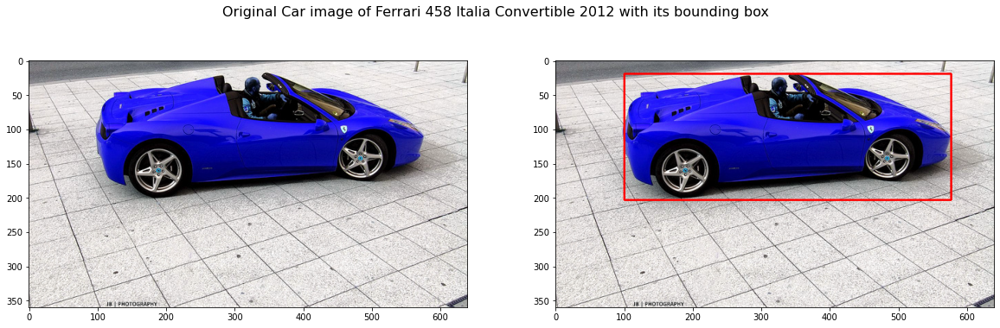

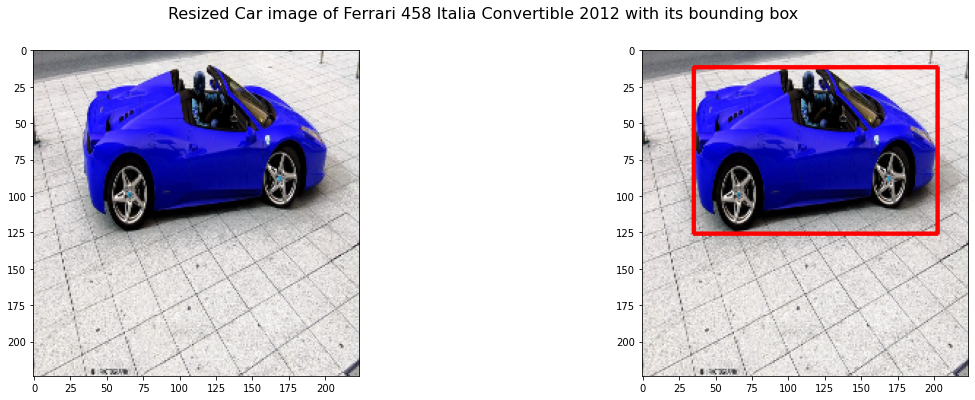

In [ ]:
bounding_box('test',1)

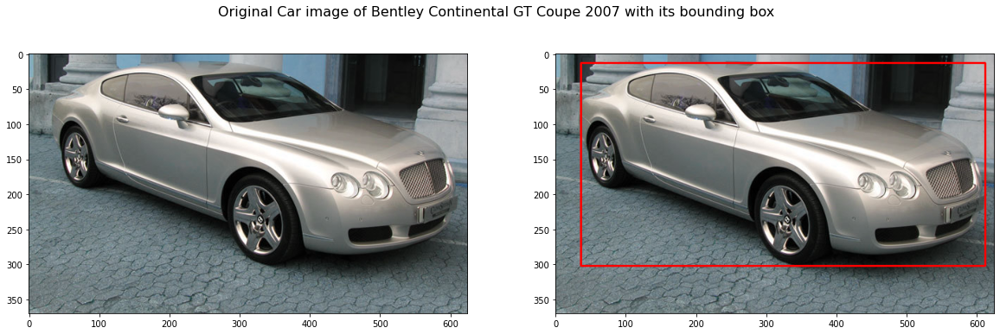

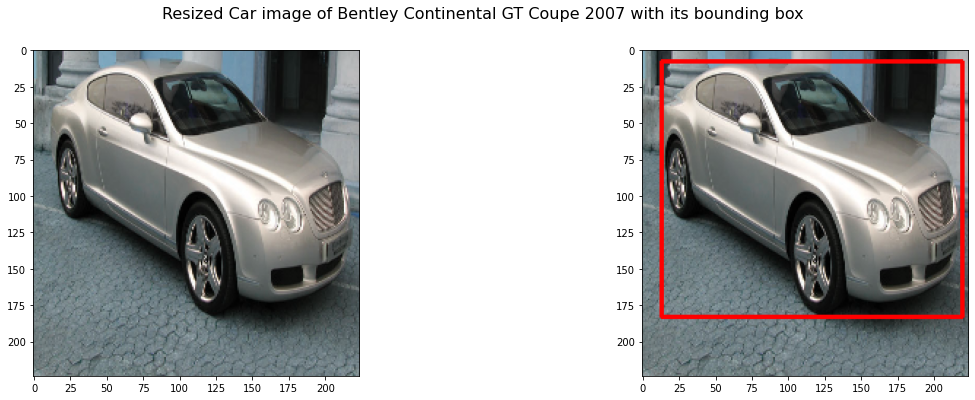

In [ ]:
bounding_box('train',1000)

The output of this method is 4 images
- First is the original image
- Second is the original image with the bounding box
- Third is the 224X224 resized image
- Fourth is the 224X224 resized image with the scaled bounding box


## Exploratory Data Analysis (EDA)

### 1. Visualization of images per label

In [ ]:
# defining a function to visualize images in the train data per label

def images_visualization_as_grid(train_or_test,labels_n,images_per_label):   # train_or_test : either 'train' or 'test'
  if train_or_test =='train':
    #imgs_dir = '/content/gdrive/My Drive/AIML/Capstone/car_images/Car Images/Train Images'
    imgs_dir = image_train_path
    df_relevant = train_data_final.copy(deep=True)
  elif train_or_test == 'test':
    #imgs_dir = '/content/gdrive/My Drive/AIML/Capstone/car_images/Car Images/Test Images'
    imgs_dir = image_test_path
    df_relevant = test_data_final.copy(deep=True)
  else:
    print('Please enter "train" or "test" as the first argument')

  for j in range(0,labels_n):   # first n labels. Can be chosen accordingly
    plt.figure(figsize=(20,2))
    class_name = df_relevant['Class Name'].unique()[j]
    plt.suptitle("Category: %s" %class_name, fontsize = 16)
    class_folder_path = os.path.join(imgs_dir, class_name)

    for i in range(0,images_per_label):
      plt.subplot(1,images_per_label,i+1)
      image_path = os.path.join(class_folder_path, df_relevant[df_relevant['Class Name'] == class_name]['Image Name'].unique()[i])
      image_read = cv2.imread(image_path, cv2.IMREAD_COLOR)
      plt.imshow(image_read)

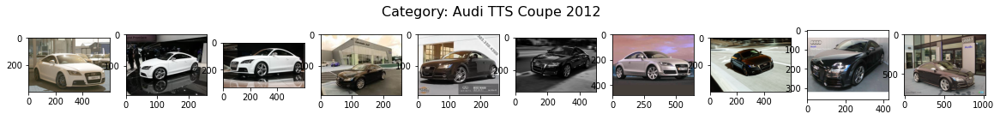

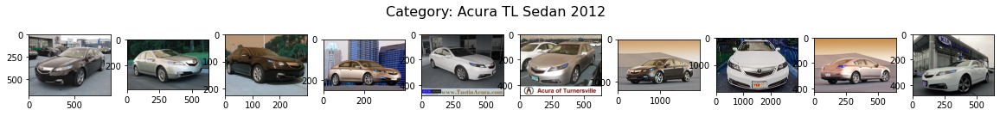

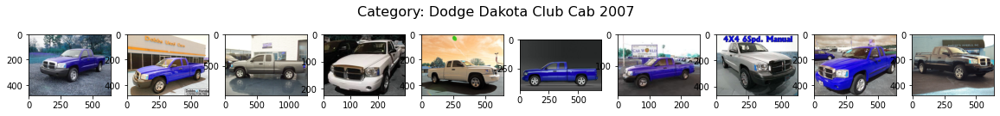

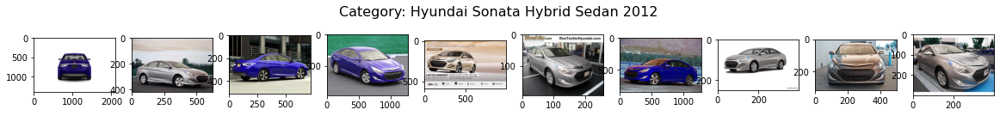

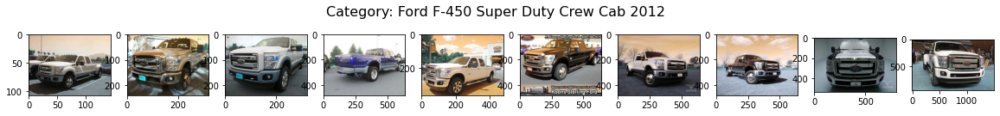

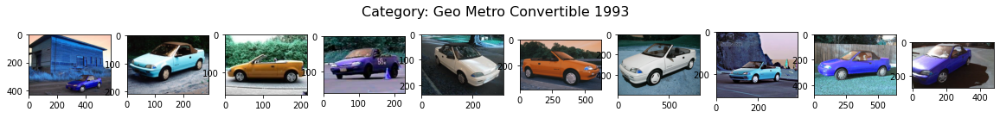

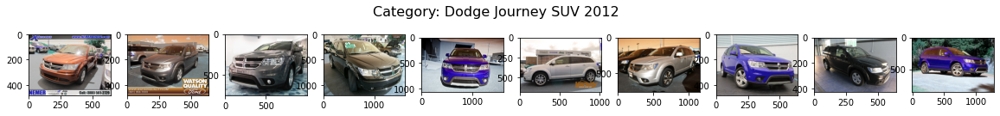

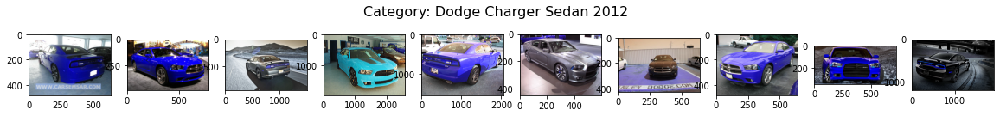

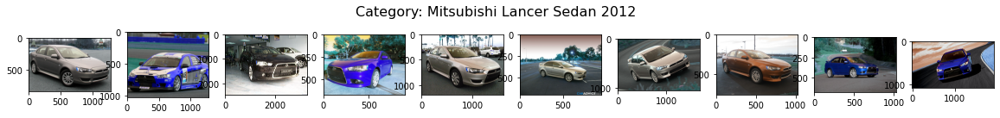

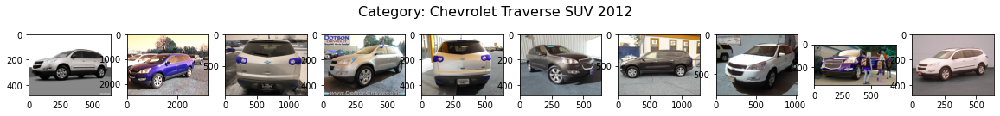

In [ ]:
images_visualization_as_grid('train',10,10)  # visualizing first 10 images in first 10 labels

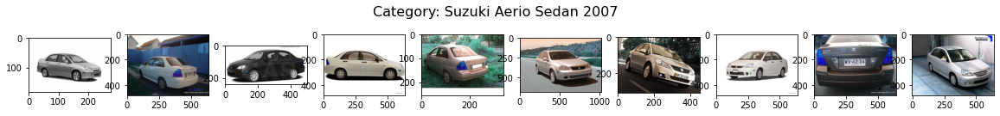

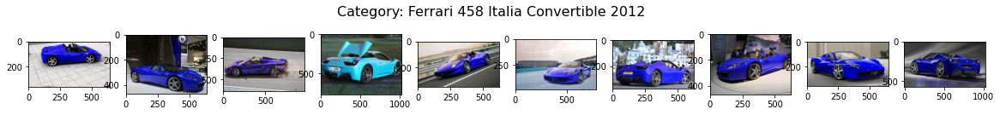

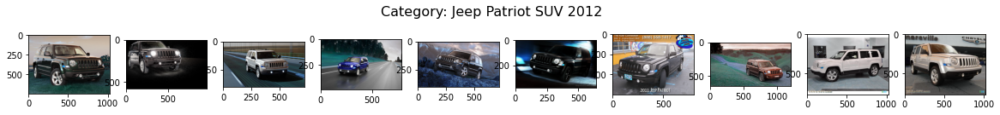

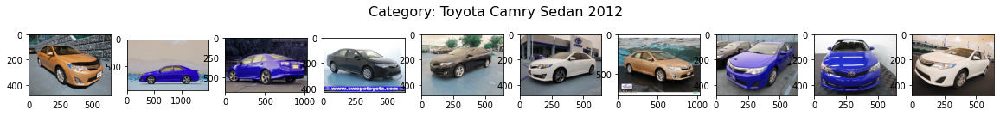

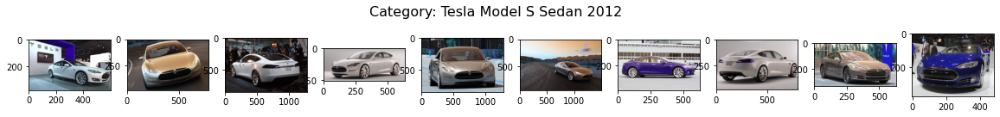

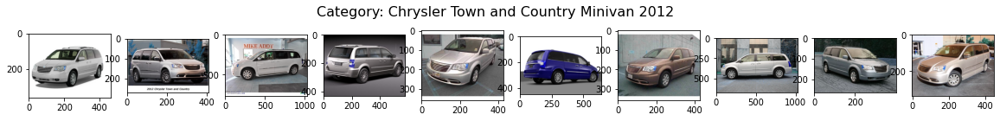

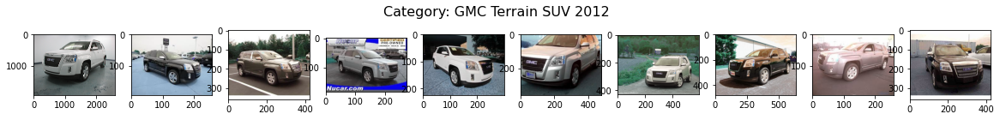

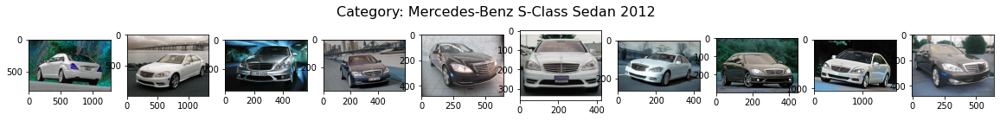

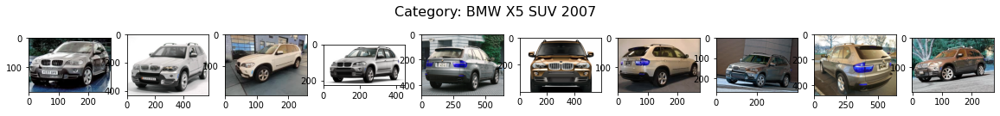

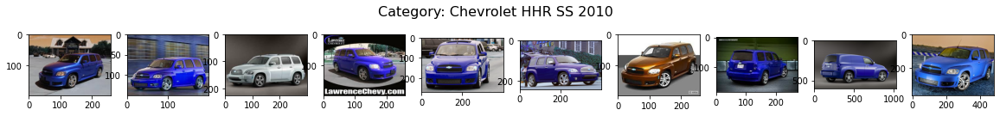

In [ ]:
images_visualization_as_grid('test',10,10)  # visualizing first 10 images in first 10 labels

### 2. Visualization of images count in classes

In [ ]:
# images count in each class

def image_count_per_class(train_or_test):
  if train_or_test =='train':
    df_relevant = train_data_final.copy(deep=True)
  elif train_or_test == 'test':
    df_relevant = test_data_final.copy(deep=True)
  else:
    print('Please enter "train" or "test" as the first argument')
  image_count_df = df_relevant['Class Name'].value_counts().sort_index().rename_axis('Car_Name').reset_index(name='image counts')
  return image_count_df

In [ ]:
image_count_df_train = image_count_per_class('train')
image_count_df_train.head()

,Car_Name,image counts
0,AM General Hummer SUV 2000,45
1,Acura Integra Type R 2001,45
2,Acura RL Sedan 2012,32
3,Acura TL Sedan 2012,43
4,Acura TL Type-S 2008,42


In [ ]:
fig = px.bar(image_count_df_train, x='Car_Name', y='image counts', color='image counts',
             labels={
                     "classCounts": "count"
                 },
                  width=1400, height=700)
fig.update_layout(title={'text': 'Train Car Class Vs Number of images', 'y':0.95,'x':0.5 })
fig.show()

**Observation**
- GMC Savana Van 2012 has the highest number of images at 68 in train data
- Hyundai Accent Sedan 2012 has the lowest number of images at 24 in train data
- Images in the classes are quite balanced in terms of image count for train data


In [ ]:
image_count_df_test = image_count_per_class('test')
image_count_df_test.head()

,Car_Name,image counts
0,AM General Hummer SUV 2000,44
1,Acura Integra Type R 2001,44
2,Acura RL Sedan 2012,32
3,Acura TL Sedan 2012,43
4,Acura TL Type-S 2008,42


In [ ]:
fig = px.bar(image_count_df_test, x='Car_Name', y='image counts', color='image counts',
             labels={
                     "classCounts": "count"
                 },
                  width=1400, height=700)
fig.update_layout(title={'text': 'Test Car Class Vs Number of images', 'y':0.95,'x':0.5 })
fig.show()

**Observation**
- 	GMC Savana Van 2012 has the highest number of images at 68 in test data
- 	Hyundai Accent Sedan 2012 has the lowest number of images at 24 in test data
- 	Images in the classes are quite balanced in terms of image count for test data


### 3. Univariate analysis

### 3.1 Pie chart for Car make

In [ ]:
# Plotting pie chart for Car Make

brandDF_train = train_data_final.groupby(['Car Make']).size().reset_index()
brandDF_train.rename(columns={0:'brand_count'}, inplace=True)

brandDF_test = test_data_final.groupby(['Car Make']).size().reset_index()
brandDF_test.rename(columns={0:'brand_count'}, inplace=True)

In [ ]:
fig = px.pie(brandDF_train, values='brand_count', names='Car Make', width=1400, height=800)
fig.update_layout(title={'text': 'Pie chart of Car Make in Train data', 'y':0.95,'x':0.5 })
fig.show()

In [ ]:
fig = px.pie(brandDF_test, values='brand_count', names='Car Make', width=1400, height=800)
fig.update_layout(title={'text': 'Pie chart of Car Make in Test data', 'y':0.95,'x':0.5 })
fig.show()

**Observation**
- 	In train data, car maker Chevrolet has the maximum amount of cars with 905 cars or 11.1% of total train set, while Maybach has the minimum number of cars at 29 which is 0.356% of total train set
- 	In test data, car maker Chevrolet has the maximum amount of cars with 905 cars or 11.1% of total train set, while Maybach has the minimum number of cars at 29 which is 0.36% of total train set


### 3.2 Count distribution of Car Type

In [ ]:
train_CarTypeClass = train_data_final['Car Type'].value_counts().sort_index().index.tolist()

trainDataArr = []
testDataArr = []
for colName in train_CarTypeClass:

    trainDataArr.append( (train_data_final['Car Type'] == colName).sum() )
    testDataArr.append( (test_data_final['Car Type'] == colName).sum() )


fig = go.Figure()
fig.add_trace(go.Bar(x=train_CarTypeClass,
                y=trainDataArr,
                name='Train Data',
                #marker_color='rgb(55, 83, 109)'
                ))
fig.add_trace(go.Bar(x=train_CarTypeClass,
                y=testDataArr,
                name='Test Data',
                #marker_color='rgb(26, 118, 255)'

                ))

fig.update_layout(
    title='Count distribution of Car Type',
    xaxis_tickfont_size=14,
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

**Observation**
- The car types are quite balanced in the train and the test dataset
- The Sedans followed by the SUVs are the most common occurring car type in the dataset while the Abarth is the least common car type in both train and test dataset


### 3.3 Count distribution of Car Make

In [ ]:
#Converted graph to plotly

trainCarMake = train_data_final['Car Make'].value_counts().sort_index().index.tolist()

trainDataArr = []
testDataArr = []
for colName in trainCarMake:

    trainDataArr.append( (train_data_final['Car Make'] == colName).sum() )
    testDataArr.append( (test_data_final['Car Make'] == colName).sum() )


fig = go.Figure()
fig.add_trace(go.Bar(x=trainCarMake,
                y=trainDataArr,
                name='Train Data',
                marker_color='rgb(55, 83, 109)'
                ))
fig.add_trace(go.Bar(x=trainCarMake,
                y=testDataArr,
                name='Test Data',
                marker_color='rgb(26, 118, 255)'

                ))

fig.update_layout(
    title='Count distribution of Car Make',
    xaxis_tickfont_size=14,
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()


**Observation**
- The car counts in train and test dataset are comparable for car makes.
- Chevrolet has the maximum car images in train and test while Maybach has the least


### 3.4 Count distribution of year of manufacturing

In [ ]:
trainCarYear = train_data_final['Year of Manufacturing'].value_counts().sort_index().index.tolist()

trainDataArr = []
testDataArr = []
for colName in trainCarYear:

    trainDataArr.append( (train_data_final['Year of Manufacturing'] == colName).sum() )
    testDataArr.append( (test_data_final['Year of Manufacturing'] == colName).sum() )


fig = go.Figure()
fig.add_trace(go.Bar(x=trainCarYear,
                y=trainDataArr,
                name='Train Data',
                #marker_color='indianred'
                ))
fig.add_trace(go.Bar(x=trainCarYear,
                y=testDataArr,
                name='Test Data',
                #marker_color='lightsalmon'

                ))

fig.update_layout(
    title='Count distribution of Year of Manufacturing',
    xaxis_tickfont_size=14,
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()


**Observation**

-	The car counts in train and test dataset are comparable for year of manufacture.
-	2012 has the maximum number of car images while the years 1991, 1997, 1999, 2000, 2002 and 2006 have very less car representation in the train and test data


### 4. Bivariate and Multivariate analysis

### 4.1 Car Make vs Car Type

In [ ]:
CarMakevsType_train = train_data_final.groupby(['Car Make','Car Type']).size().reset_index()
CarMakevsType_train.rename(columns={0:'brand_count'}, inplace=True)
fig = px.bar(CarMakevsType_train, x="Car Make", y="brand_count", color="Car Type", title="Model count chart for train data", width=1400, height=800)
fig.show()

In [ ]:
CarMakevsType_test = test_data_final.groupby(['Car Make','Car Type']).size().reset_index()
CarMakevsType_test.rename(columns={0:'brand_count'}, inplace=True)
fig = px.bar(CarMakevsType_test, x="Car Make", y="brand_count", color="Car Type", title="Model count chart for test data", width=1400, height=800)
fig.show()

**Observation**
-The car counts in train and test dataset are comparable for year of manufacture.
- Chevrolet has the maximum number of car and car type representation in the train and test datasets.
- AM, Isuzu, Jeep, Land Rover, Mazda have only one car type representation in  train and test data– SUV
- Fisker, Lincoln, Mitsubishi, Porsche and tesla have only one type of car type representation  in train and test data- Sedan
- Geo, MINI, Maybach and Smart have only one type of car type representation  in train and test data- Convertible
- McLaren and Plymouth have only one type of car type representation  in train and test data- Coupe
- Daewoo has only one type of car type representation  in train and test data- Wagon
- Ram has only one type of car type representation  in train and test data- Minivan


### 4.2 3D scatter plot of data

In [ ]:
fig = px.scatter_3d(train_data_final, x='Car Type', y='Car Make', z='Year of Manufacturing', color='Year of Manufacturing')
fig.update_layout(height=700, width=1300)
fig.show()

In [ ]:
fig = px.scatter_3d(test_data_final, x='Car Type', y='Car Make', z='Year of Manufacturing', color='Year of Manufacturing')
fig.update_layout(height=700, width=1300)
fig.show()

#### Conclusion

- In dataset we have total 8,144 training images and 8,041 images
- Images are coverted into 224 x 224 .
- We have Unique 157 brand in train dataset
- feature and masks data saved into npy files for future use.
- Image augmentation can be used for future data modelling for CNN, RCNN and hybrid models.
- Most of the cars and their models are launched in 2012 with respect to other years

# Step 1: Design, train and test CNN models to classify the car

In [ ]:
# train test split

X_train = np.zeros((train_data_final['car_img_array_resized128X128'].shape[0],128,128,3))
X_test = np.zeros((test_data_final['car_img_array_resized128X128'].shape[0],128,128,3))
# X_train = train_data_final['car_img_array_resized224X224']
# X_test = test_data_final['car_img_array_resized224X224']
for i in range(0,X_train.shape[0]):
  X_train[i] = train_data_final['car_img_array_resized128X128'][i]/255

for i in range(0,X_test.shape[0]):
  X_test[i] = test_data_final['car_img_array_resized128X128'][i]/255

le=LabelEncoder()
y_train =le.fit_transform(train_data_final['Image class'])
y_train = to_categorical(y_train,196)

y_test =le.fit_transform(test_data_final['Image class'])
y_test = to_categorical(y_test,196)

In [ ]:
np.save(project_path +'X_train.npy', X_train)
np.save(project_path +'X_test.npy', X_test)
np.save(project_path +'y_train.npy', y_train)
np.save(project_path +'y_test.npy', y_test)

In [ ]:
X_train= np.load(project_path + 'X_train.npy' ,allow_pickle=True)
y_train= np.load(project_path + 'y_train.npy' ,allow_pickle=True)
X_test= np.load(project_path + 'X_test.npy' ,allow_pickle=True)
y_test= np.load(project_path + 'y_test.npy' ,allow_pickle=True)

In [ ]:
del test_data_final, train_data_final

In [ ]:
# script to plot the train and validation accuracy with the number of epochs

# with plotly
# def plot_loss_accuracy(model,title_text):
#   fig = go.Figure()
#   fig = make_subplots(rows=1, cols=2)

#   fig.add_trace(go.Scatter(y=model.history['loss'],  mode='lines', name='loss'), row=1, col=1)
#   fig.add_trace(go.Scatter(y=model.history['val_loss'],  mode='lines', name='val_loss '), row=1, col=1)

#   fig.add_trace(go.Scatter(y=model.history['accuracy'],  mode='lines', name='acc'), row=1, col=2)
#   fig.add_trace(go.Scatter(y=model.history['val_accuracy'],  mode='lines', name='val_acc '), row=1, col=2)

#   title_text = "Accuracy and loss for " + title_text
#   fig.update_layout(height=600, width=1400, title_text = title_text)

#   # Update xaxis properties
#   fig.update_xaxes(title_text="Epochs", row=1, col=1)
#   fig.update_xaxes(title_text="Epochs", row=1, col=2)

#   # Update yaxis properties
#   fig.update_yaxes(title_text="Loss", row=1, col=1)
#   fig.update_yaxes(title_text="Accuracy", row=1, col=2)

#   fig.show()

# without plotly

def plot_loss_accuracy(classifier_model,title_text):
  if early_stop.stopped_epoch == 0:
    acc_train = classifier_model.history['accuracy']
    acc_val = classifier_model.history['val_accuracy']
    epochs = range(1,51)   # run for all 30 epochs
    plt.figure(figsize=(20,6))
    plt.margins(y=0.3)
    plt.subplot(1,2,1)
    plt.plot(epochs, acc_train, 'g', label='Training accuracy')
    plt.plot(epochs, acc_val, 'b', label='validation accuracy')
    plt.title('Training and Validation Accuracy for '+title_text)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.grid()
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(epochs, classifier_model.history['loss'], 'g', label='Training loss')
    plt.plot(epochs, classifier_model.history['val_loss'], 'b', label='validation loss')
    plt.title('Training and Validation Loss for '+title_text)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()
  else:
    acc_train = classifier_model.history['accuracy']
    acc_val = classifier_model.history['val_accuracy']
    epochs = range(1,early_stop.stopped_epoch+2)   # run till the last stopped epoch caused because of 'earlystopping'

    plt.figure(figsize=(20,6))
    plt.margins(y=0.3)
    plt.subplot(1,2,1)
    plt.plot(epochs, acc_train, 'g', label='Training accuracy')
    plt.plot(epochs, acc_val, 'b', label='validation accuracy')
    plt.title('Training and Validation Accuracy for '+title_text)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.grid()
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(epochs, classifier_model.history['loss'], 'g', label='Training loss')
    plt.plot(epochs, classifier_model.history['val_loss'], 'b', label='validation loss')
    plt.title('Training and Validation Loss for '+title_text)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
from tensorflow.keras.utils import Sequence

class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

In [ ]:
train_gen = DataGenerator(X_train, y_train, 32)
test_gen = DataGenerator(X_test, y_test, 32)

## 1. Vanilla CNN (without tuning)

In [ ]:
# define the cnn model

def cnn_basic():
  model = Sequential()
  model.add(Conv2D(32, (3, 3), input_shape = (128, 128, 3), activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(0.1))
  model.add(BatchNormalization())

  model.add(Conv2D(32, 3, padding='same', activation='relu'))
  model.add(MaxPooling2D())
  model.add(Dropout(0.1))
  model.add(BatchNormalization())

  model.add(Conv2D(64, (3, 3), strides = (1,1), activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(0.1))
  model.add(BatchNormalization())

  model.add(Conv2D(64, 3, padding='same', activation='relu'))
  model.add(MaxPooling2D())
  model.add(Conv2D(128, 3, padding='same', activation='relu'))
  model.add(MaxPooling2D())

  # Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
  model.add(Conv2D(128, (3, 3), strides = (1,1), activation = 'relu', padding = 'same'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(0.1))
  model.add(BatchNormalization())

  model.add(Flatten())

  model.add(Dense(256, activation = 'relu'))
  model.add(Dense(196, activation='softmax', name="layer_output"))

  adam = optimizers.Adam()

  # Compile model
  model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
  return model

In [ ]:
CNN_basic_model = cnn_basic()
CNN_basic_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 63, 63, 32)        0         
                                                                 
 batch_normalization_4 (Batc  (None, 63, 63, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 63, 63, 32)        9248      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 31, 31, 32)      

In [ ]:
# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, mode='min')

# Fit the model
CNN_classifier_basic = CNN_basic_model.fit(train_gen, batch_size=32, epochs=50, validation_data=test_gen, callbacks=[early_stop], verbose= 1)

Epoch 1/50
255/255 [==============================] - 9s 27ms/step - loss: 5.2376 - accuracy: 0.0091 - val_loss: 5.6555 - val_accuracy: 0.0085
Epoch 2/50
255/255 [==============================] - 6s 23ms/step - loss: 5.0402 - accuracy: 0.0166 - val_loss: 5.4567 - val_accuracy: 0.0107
Epoch 3/50
255/255 [==============================] - 6s 23ms/step - loss: 4.8984 - accuracy: 0.0307 - val_loss: 4.9517 - val_accuracy: 0.0307
Epoch 4/50
255/255 [==============================] - 6s 23ms/step - loss: 4.7362 - accuracy: 0.0392 - val_loss: 5.1582 - val_accuracy: 0.0275
Epoch 5/50
255/255 [==============================] - 6s 23ms/step - loss: 4.5449 - accuracy: 0.0565 - val_loss: 4.8525 - val_accuracy: 0.0377
Epoch 6/50
255/255 [==============================] - 6s 23ms/step - loss: 4.3749 - accuracy: 0.0696 - val_loss: 4.6829 - val_accuracy: 0.0478
Epoch 7/50
255/255 [==============================] - 6s 23ms/step - loss: 4.0938 - accuracy: 0.0974 - val_loss: 4.4841 - val_accuracy: 0.0711

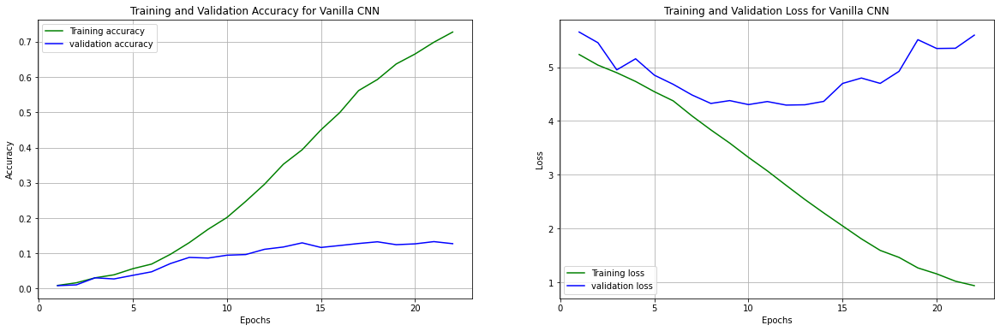

In [ ]:
# plot the train and validation accuracy with the number of epochs

plot_loss_accuracy(CNN_classifier_basic,'Vanilla CNN')

In [ ]:
# prediction accuracy on Test data

y_train_pred = CNN_basic_model.predict(X_train)
y_train_pred = np.argmax(y_train_pred,axis=1)  # predicted y_train converted back to label (earlier one hot encoded)

y_test_pred = CNN_basic_model.predict(X_test)
y_test_pred = np.argmax(y_test_pred,axis=1)  # predicted y_test converted back to label (earlier one hot encoded)

y_train_true = np.argmax(y_train,axis=1)
y_test_true = np.argmax(y_test,axis=1)

#get Accuracy Score for train and test
cnn_vanilla_accuracy_train = metrics.accuracy_score(y_train_true, y_train_pred)
cnn_vanilla_accuracy_test = metrics.accuracy_score(y_test_true, y_test_pred)

In [ ]:
# Save the entire model
CNN_basic_model.save('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_basic_model.h5')

# Save the weights
CNN_basic_model.save_weights('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_basic_weights.h5')

In [ ]:
del CNN_basic_model, CNN_classifier_basic, y_train_pred, y_test_pred, y_train_true, y_test_true

## 2. CNN with PCA

### PCA

In [ ]:
def split_flatten(X):
  Xr, Xg, Xb = [],[],[]
  for samples in X:
    r, g, b = cv2.split(samples)
    Xr.append(r.flatten())
    Xg.append(g.flatten())
    Xb.append(b.flatten())

  Xr = np.array(Xr)
  Xg = np.array(Xg)
  Xb = np.array(Xb)
  return (Xr, Xg, Xb)

In [ ]:
X_train_r, X_train_g, X_train_b = split_flatten(X_train)
X_test_r, X_test_g, X_test_b = split_flatten(X_test)

In [ ]:
np.save(project_path +'X_train_r.npy', X_train_r)
np.save(project_path +'X_test_r.npy', X_test_r)
np.save(project_path +'X_train_g.npy', X_train_g)
np.save(project_path +'X_test_g.npy', X_test_g)
np.save(project_path +'X_train_b.npy', X_train_b)
np.save(project_path +'X_test_b.npy', X_test_b)

In [ ]:
del X_train_g, X_test_g, X_train_b, X_test_b

#### PCA on R-channel

In [ ]:
# applying PCA

n_components = 0.95  # taking components that explain atleast 95% variability
RPCA_95 = RandomizedPCA(n_components=n_components, whiten=True, random_state = 1)

RPCA_95.fit(X_train_r)
#Transform the data into lower dimensions
Xr_train_pca = RPCA_95.transform(X_train_r)
Xr_test_pca = RPCA_95.transform(X_test_r)

In [ ]:
del X_train_r, X_test_r

In [ ]:
Xr_train_pca_trans = RPCA_95.inverse_transform(Xr_train_pca)
Xr_test_pca_trans = RPCA_95.inverse_transform(Xr_test_pca)

In [ ]:
del Xr_train_pca, Xr_test_pca

In [ ]:
Xr_train_pca_trans_reshaped = Xr_train_pca_trans.reshape(Xr_train_pca_trans.shape[0],-1,128)
Xr_test_pca_trans_reshaped = Xr_test_pca_trans.reshape(Xr_test_pca_trans.shape[0],-1,128)

In [ ]:
del Xr_train_pca_trans, Xr_test_pca_trans

#### PCA on G-channel

In [ ]:
X_train_g = np.load(project_path + 'X_train_g.npy', allow_pickle = True)
X_test_g = np.load(project_path + 'X_test_g.npy', allow_pickle = True)

In [ ]:
# applying PCA

n_components = 0.95  # taking components that explain atleast 98% variability
RPCA_95 = RandomizedPCA(n_components=n_components, whiten=True, random_state = 1)

RPCA_95.fit(X_train_g)
#Transform the data into lower dimensions
Xg_train_pca = RPCA_95.transform(X_train_g)
Xg_test_pca = RPCA_95.transform(X_test_g)

In [ ]:
del X_train_g, X_test_g

In [ ]:
Xg_train_pca_trans = RPCA_95.inverse_transform(Xg_train_pca)
Xg_test_pca_trans = RPCA_95.inverse_transform(Xg_test_pca)

In [ ]:
del Xg_train_pca, Xg_test_pca

In [ ]:
Xg_train_pca_trans_reshaped = Xg_train_pca_trans.reshape(Xg_train_pca_trans.shape[0],-1,128)
Xg_test_pca_trans_reshaped = Xg_test_pca_trans.reshape(Xg_test_pca_trans.shape[0],-1,128)

In [ ]:
del Xg_train_pca_trans, Xg_test_pca_trans

#### PCA on B-channel

In [ ]:
X_train_b = np.load(project_path + 'X_train_b.npy', allow_pickle = True)
X_test_b = np.load(project_path + 'X_test_b.npy', allow_pickle = True)

In [ ]:
# applying PCA

n_components = 0.95  # taking components that explain atleast 98% variability
RPCA_95 = RandomizedPCA(n_components=n_components, whiten=True, random_state = 1)

RPCA_95.fit(X_train_b)
#Transform the data into lower dimensions
Xb_train_pca = RPCA_95.transform(X_train_b)
Xb_test_pca = RPCA_95.transform(X_test_b)

In [ ]:
del X_train_b

In [ ]:
del X_test_b

In [ ]:
Xb_train_pca_trans = RPCA_95.inverse_transform(Xb_train_pca)
Xb_test_pca_trans = RPCA_95.inverse_transform(Xb_test_pca)

In [ ]:
del Xb_train_pca, Xb_test_pca

In [ ]:
Xb_train_pca_trans_reshaped = Xb_train_pca_trans.reshape(Xb_train_pca_trans.shape[0],-1,128)
Xb_test_pca_trans_reshaped = Xb_test_pca_trans.reshape(Xb_test_pca_trans.shape[0],-1,128)

In [ ]:
del Xb_train_pca_trans, Xb_test_pca_trans

In [ ]:
X_train_pca_final = np.zeros((Xr_train_pca_trans_reshaped.shape[0],128,128,3))
X_train_pca_final[:,:,:,0] = Xr_train_pca_trans_reshaped
X_train_pca_final[:,:,:,1] = Xg_train_pca_trans_reshaped
X_train_pca_final[:,:,:,2] = Xb_train_pca_trans_reshaped


In [ ]:
del Xr_train_pca_trans_reshaped, Xg_train_pca_trans_reshaped, Xb_train_pca_trans_reshaped

In [ ]:
X_test_pca_final = np.zeros((Xr_test_pca_trans_reshaped.shape[0],128,128,3))
X_test_pca_final[:,:,:,0] = Xr_test_pca_trans_reshaped
X_test_pca_final[:,:,:,1] = Xg_test_pca_trans_reshaped
X_test_pca_final[:,:,:,2] = Xb_test_pca_trans_reshaped

In [ ]:
del Xr_test_pca_trans_reshaped, Xg_test_pca_trans_reshaped, Xb_test_pca_trans_reshaped

### Saving PCA data

In [ ]:
np.save(project_path +'X_train_pca_final.npy', X_train_pca_final)
np.save(project_path +'X_test_pca_final.npy', X_test_pca_final)

### Loading PCA data

In [ ]:
X_train_pca_final = np.load(project_path + 'X_train_pca_final.npy', allow_pickle = True)
X_test_pca_final = np.load(project_path + 'X_test_pca_final.npy', allow_pickle = True)

In [ ]:
train_gen_pca = DataGenerator(X_train_pca_final, y_train, 32)
test_gen_pca = DataGenerator(X_test_pca_final, y_test, 32)

### Applying model

In [ ]:
CNN_PCA_model = cnn_basic()

In [ ]:
# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

# Fit the model
CNN_classifier_PCA = CNN_PCA_model.fit(train_gen_pca, batch_size=32, epochs=50, validation_data=test_gen_pca, callbacks=[early_stop], verbose= 1)

Epoch 1/50
255/255 [==============================] - 8s 28ms/step - loss: 5.2744 - accuracy: 0.0079 - val_loss: 5.3566 - val_accuracy: 0.0085
Epoch 2/50
255/255 [==============================] - 7s 26ms/step - loss: 5.1613 - accuracy: 0.0133 - val_loss: 5.2160 - val_accuracy: 0.0139
Epoch 3/50
255/255 [==============================] - 7s 26ms/step - loss: 5.0645 - accuracy: 0.0199 - val_loss: 5.1292 - val_accuracy: 0.0200
Epoch 4/50
255/255 [==============================] - 7s 27ms/step - loss: 4.9649 - accuracy: 0.0278 - val_loss: 5.0782 - val_accuracy: 0.0216
Epoch 5/50
255/255 [==============================] - 7s 26ms/step - loss: 4.8571 - accuracy: 0.0389 - val_loss: 4.9354 - val_accuracy: 0.0331
Epoch 6/50
255/255 [==============================] - 7s 27ms/step - loss: 4.7568 - accuracy: 0.0468 - val_loss: 5.1449 - val_accuracy: 0.0180
Epoch 7/50
255/255 [==============================] - 7s 26ms/step - loss: 4.6338 - accuracy: 0.0544 - val_loss: 5.0769 - val_accuracy: 0.0374

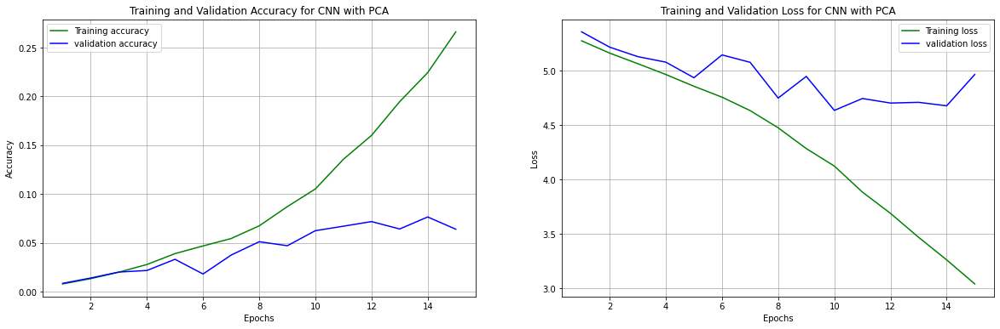

In [ ]:
# plot the train and validation accuracy with the number of epochs

plot_loss_accuracy(CNN_classifier_PCA,'CNN with PCA')

In [ ]:
# prediction accuracy on Test data

y_train_pred = CNN_PCA_model.predict(X_train_pca_final)
y_train_pred = np.argmax(y_train_pred,axis=1)  # predicted y_train converted back to label (earlier one hot encoded)

y_test_pred = CNN_PCA_model.predict(X_test_pca_final)
y_test_pred = np.argmax(y_test_pred,axis=1)  # predicted y_test converted back to label (earlier one hot encoded)

y_train_true = np.argmax(y_train,axis=1)
y_test_true = np.argmax(y_test,axis=1)

#get Accuracy Score for train and test
cnn_pca_accuracy_train = metrics.accuracy_score(y_train_true, y_train_pred)
cnn_pca_accuracy_test = metrics.accuracy_score(y_test_true, y_test_pred)


In [ ]:
# Save the entire model
CNN_PCA_model.save('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_PCA_model.h5')

# Save the weights
CNN_PCA_model.save_weights('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_PCA_weights.h5')

In [ ]:
del X_train_pca_final, X_test_pca_final, train_gen_pca, test_gen_pca, CNN_PCA_model, CNN_classifier_PCA, y_train_pred, y_test_pred, y_train_true, y_test_true

## 3. Hyperparameter tuning of CNN

In this section various hyperparameters are tuned one by one. Convolutional neural networks has various hyperparameters to tune as listed below. Initially all the hyperparameters were used while hypertuning but the computational time was huge with the code crashing everytime. Later gridsearch was tried on each parameter one by one and even that crashed. Hence a manual, rudimentary approach is taken to tune each parameter one by one and its results are passed on to next gridsearch for tuning the next important hyperparameter.

1. **Number of layers**- The first hyperparameter to tune is the number of layers in the CNN. In this problem, there is one layer initially after which the number of subsequent layers are run over in a for loop with an increment of 2 starting from 1 and going till 11, a total of 6.

2. **Filter size**-

3. **Dropout**-

4. **Learning rate**-

### 1. No. of layers

In [ ]:
y_test_true = np.argmax(y_test,axis=1)
accuracy_matrix = np.zeros((5,1))
k=0
for layers in range(3,12,2):
  model = Sequential()
  # first layer
  model.add(Conv2D(32, (3, 3), input_shape = (128, 128, 3), activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(0.1))
  model.add(BatchNormalization())

  # for loop for deciding the number of layers
  for i in np.arange(1,layers+1):
    model.add(Conv2D(filters=32*(2**(math.ceil((i+1)/2)-1)), kernel_size = 3, padding ='same', activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2),padding='same'))
    model.add(Dropout(0.1))
    model.add(BatchNormalization())

  model.add(Flatten())
  model.add(Dense(256, activation = 'relu'))

  model.add(Dense(196, activation='softmax'))   # output layer
  opt = Adam()   # optimizer
  # Compile model
  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  # EarlyStopping
  early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

  # Fit the model
  model.fit(train_gen, batch_size=32, epochs=50, validation_data=test_gen, callbacks=[early_stop], verbose= 0)
  y_test_pred = model.predict(X_test)
  y_test_pred = np.argmax(y_test_pred,axis=1)
  print("Accuracy after",k+1,'run is: ', metrics.accuracy_score(y_test_true, y_test_pred))
  accuracy_matrix[k] = metrics.accuracy_score(y_test_true, y_test_pred)
  k = k+1
  del model, y_test_pred

Accuracy after 1 run is:  0.017783857729138167
Accuracy after 2 run is:  0.07897027732869046
Accuracy after 3 run is:  0.10695187165775401
Accuracy after 4 run is:  0.10210172864071633
Accuracy after 5 run is:  0.08220370600671559


In [ ]:
# choosing the number of layers

accuracy_matrix = list(accuracy_matrix)
max_acc = max(accuracy_matrix)
max_index = accuracy_matrix.index(max_acc)
layers_tuned = max_index*2 + 3

In [ ]:
print(accuracy_matrix)
print('The final number of layers chosen after tuning is', layers_tuned)

[array([0.01778386]), array([0.07897028]), array([0.10695187]), array([0.10210173]), array([0.08220371])]
The final number of layers chosen after tuning is 7


In [ ]:
del accuracy_matrix, max_acc, max_index, y_test_true

### 2. Filter size

In [ ]:
y_test_true = np.argmax(y_test,axis=1)
accuracy_matrix_filter_size = np.zeros((3,1))
k=0
for filter_size in range(3,8,2):
  model = Sequential()
  # first layer
  model.add(Conv2D(32, (filter_size, filter_size), input_shape = (128, 128, 3), activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(0.1))
  model.add(BatchNormalization())

  # for loop for deciding the number of layers
  for i in np.arange(1,layers_tuned+1):
    model.add(Conv2D(filters=32*(2**(math.ceil((i+1)/2)-1)), kernel_size = filter_size, padding ='same', activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2),padding='same'))
    model.add(Dropout(0.1))
    model.add(BatchNormalization())

  model.add(Flatten())
  model.add(Dense(256, activation = 'relu'))

  model.add(Dense(196, activation='softmax'))   # output layer
  opt = Adam()   # optimizer
  # Compile model
  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  # EarlyStopping
  early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

  # Fit the model
  model.fit(train_gen, batch_size=32, epochs=50, validation_data=test_gen, callbacks=[early_stop], verbose= 0)
  y_test_pred = model.predict(X_test)
  y_test_pred = np.argmax(y_test_pred,axis=1)
  print("Accuracy after",k+1,'run is: ', metrics.accuracy_score(y_test_true, y_test_pred))
  accuracy_matrix_filter_size[k] = metrics.accuracy_score(y_test_true, y_test_pred)
  k = k+1
  del model, y_test_pred

Accuracy after 1 run is:  0.07921900261161548
Accuracy after 2 run is:  0.05360029847033951
Accuracy after 3 run is:  0.03979604526800149


In [ ]:
accuracy_matrix_filter_size = list(accuracy_matrix_filter_size)
max_acc = max(accuracy_matrix_filter_size)
max_index = accuracy_matrix_filter_size.index(max_acc)
filter_size_tuned = max_index*2 + 3

In [ ]:
print(accuracy_matrix_filter_size)
print('The final filter size chosen after tuning is', filter_size_tuned)

[array([0.079219]), array([0.0536003]), array([0.03979605])]
The final filter size chosen after tuning is 3


In [ ]:
del accuracy_matrix_filter_size, max_acc, max_index, y_test_true

### 3.Dropout

In [ ]:
y_test_true = np.argmax(y_test,axis=1)
accuracy_matrix_dropout = np.zeros((4,1))
k=0
for j in range(1,5):
  model = Sequential()
  # first layer
  model.add(Conv2D(32, (filter_size_tuned, filter_size_tuned), input_shape = (128, 128, 3), activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(0.1*j))
  model.add(BatchNormalization())

  # for loop for deciding the number of layers
  for i in np.arange(1,layers_tuned+1):
    model.add(Conv2D(filters=32*(2**(math.ceil((i+1)/2)-1)), kernel_size = filter_size_tuned, padding ='same', activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2),padding='same'))
    model.add(Dropout(0.1*j))
    model.add(BatchNormalization())

  model.add(Flatten())
  model.add(Dense(256, activation = 'relu'))

  model.add(Dense(196, activation='softmax'))   # output layer
  opt = Adam()   # optimizer
  # Compile model
  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  # EarlyStopping
  early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

  # Fit the model
  model.fit(train_gen, batch_size=32, epochs=50, validation_data=test_gen, callbacks=[early_stop], verbose= 0)
  y_test_pred = model.predict(X_test)
  y_test_pred = np.argmax(y_test_pred,axis=1)
  print("Accuracy after",k+1,'run is: ', metrics.accuracy_score(y_test_true, y_test_pred))
  accuracy_matrix_dropout[k] = metrics.accuracy_score(y_test_true, y_test_pred)
  k = k+1

Accuracy after 1 run is:  0.06653401318244
Accuracy after 2 run is:  0.11453799278696679
Accuracy after 3 run is:  0.09463997015296605
Accuracy after 4 run is:  0.0585748041288397


In [ ]:
accuracy_matrix_dropout = list(accuracy_matrix_dropout)
max_acc = max(accuracy_matrix_dropout)
max_index = accuracy_matrix_dropout.index(max_acc)
dropout_tuned = (max_index+1)*0.1

In [ ]:
print(accuracy_matrix_dropout)
print('The final dropout chosen after tuning is', dropout_tuned)

[array([0.06653401]), array([0.11453799]), array([0.09463997]), array([0.0585748])]
The final dropout chosen after tuning is 0.2


In [ ]:
del model, accuracy_matrix_dropout, max_acc, max_index, y_test_pred, y_test_true

### 4. Learning rate

In [ ]:
y_test_true = np.argmax(y_test,axis=1)
accuracy_matrix_lr = np.zeros((5,1))
k=0
for j in range(0,5):
  model = Sequential()
  # first layer
  model.add(Conv2D(32, (filter_size_tuned, filter_size_tuned), input_shape = (128, 128, 3), activation = 'relu'))
  model.add(MaxPooling2D(pool_size = (2, 2)))
  model.add(Dropout(dropout_tuned))
  model.add(BatchNormalization())


  # for loop for deciding the number of layers
  for i in np.arange(1,layers_tuned+1):
    model.add(Conv2D(filters=32*(2**(math.ceil((i+1)/2)-1)), kernel_size = filter_size_tuned, padding ='same', activation = 'relu'))
    model.add(MaxPooling2D(pool_size = (2, 2),padding='same'))
    model.add(Dropout(dropout_tuned))
    model.add(BatchNormalization())

  model.add(Flatten())
  model.add(Dense(256, activation = 'relu'))

  model.add(Dense(196, activation='softmax'))   # output layer
  opt = Adam(learning_rate = 10**-j)   # optimizer
  # Compile model
  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

  # EarlyStopping
  early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

  # Fit the model
  model.fit(train_gen, batch_size=32, epochs=50, validation_data=test_gen, callbacks=[early_stop], verbose= 0)
  y_test_pred = model.predict(X_test)
  y_test_pred = np.argmax(y_test_pred,axis=1)
  print("Accuracy after",k+1,'run is: ', metrics.accuracy_score(y_test_true, y_test_pred))
  accuracy_matrix_lr[k] = metrics.accuracy_score(y_test_true, y_test_pred)
  k = k+1
  del model, y_test_pred

Accuracy after 1 run is:  0.004974505658500186
Accuracy after 2 run is:  0.008456659619450317
Accuracy after 3 run is:  0.008456659619450317
Accuracy after 4 run is:  0.10297226713095387
Accuracy after 5 run is:  0.004974505658500186


In [ ]:
accuracy_matrix_lr = list(accuracy_matrix_lr)
max_acc = max(accuracy_matrix_lr)
max_index = accuracy_matrix_lr.index(max_acc)
lr_tuned = 10**(-max_index)

In [ ]:
print(accuracy_matrix_lr)
print('The final learning rate chosen after tuning is', lr_tuned)

[array([0.00497451]), array([0.00845666]), array([0.00845666]), array([0.10297227]), array([0.00497451])]
The final learning rate chosen after tuning is 0.001


In [ ]:
del accuracy_matrix_lr, max_acc, max_index, y_test_true

### 5. Running the final hypertuned model

In [ ]:
y_test_true = np.argmax(y_test,axis=1)

CNN_hypertuned_model = Sequential()
# first layer
CNN_hypertuned_model.add(Conv2D(32, (filter_size_tuned, filter_size_tuned), input_shape = (128, 128, 3), activation = 'relu'))
CNN_hypertuned_model.add(MaxPooling2D(pool_size = (2, 2)))
CNN_hypertuned_model.add(Dropout(dropout_tuned))
CNN_hypertuned_model.add(BatchNormalization())


# for loop for deciding the number of layers
for i in np.arange(1,layers_tuned+1):
  CNN_hypertuned_model.add(Conv2D(filters=32*(2**(math.ceil((i+1)/2)-1)), kernel_size = filter_size_tuned, padding ='same', activation = 'relu'))
  CNN_hypertuned_model.add(MaxPooling2D(pool_size = (2, 2),padding='same'))
  CNN_hypertuned_model.add(Dropout(dropout_tuned))
  CNN_hypertuned_model.add(BatchNormalization())

CNN_hypertuned_model.add(Flatten())
CNN_hypertuned_model.add(Dense(256, activation = 'relu'))

CNN_hypertuned_model.add(Dense(196, activation='softmax'))   # output layer
opt = Adam(learning_rate = lr_tuned)   # optimizer
# Compile model
CNN_hypertuned_model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

# Fit the model
CNN_hypertuned = CNN_hypertuned_model.fit(train_gen, batch_size=32, epochs=50, validation_data=test_gen, callbacks=[early_stop], verbose= 1)

Epoch 1/50
255/255 [==============================] - 8s 26ms/step - loss: 5.4242 - accuracy: 0.0069 - val_loss: 5.6479 - val_accuracy: 0.0046
Epoch 2/50
255/255 [==============================] - 6s 25ms/step - loss: 5.2031 - accuracy: 0.0141 - val_loss: 5.7741 - val_accuracy: 0.0056
Epoch 3/50
255/255 [==============================] - 6s 25ms/step - loss: 5.0432 - accuracy: 0.0225 - val_loss: 5.1525 - val_accuracy: 0.0155
Epoch 4/50
255/255 [==============================] - 6s 25ms/step - loss: 4.9395 - accuracy: 0.0269 - val_loss: 5.5260 - val_accuracy: 0.0117
Epoch 5/50
255/255 [==============================] - 6s 25ms/step - loss: 4.8204 - accuracy: 0.0317 - val_loss: 4.9791 - val_accuracy: 0.0284
Epoch 6/50
255/255 [==============================] - 6s 25ms/step - loss: 4.7042 - accuracy: 0.0430 - val_loss: 4.9994 - val_accuracy: 0.0321
Epoch 7/50
255/255 [==============================] - 6s 25ms/step - loss: 4.5942 - accuracy: 0.0501 - val_loss: 4.7621 - val_accuracy: 0.0414

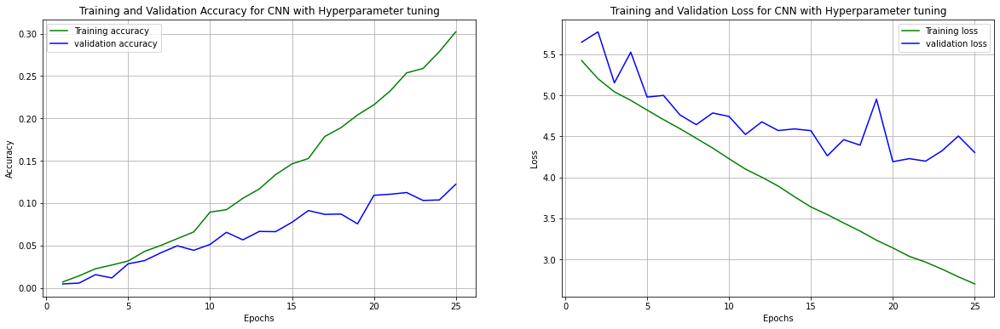

In [ ]:
# plot the train and validation accuracy with the number of epochs

plot_loss_accuracy(CNN_hypertuned,'CNN with Hyperparameter tuning')

In [ ]:
# prediction accuracy on Test data

y_train_pred = CNN_hypertuned_model.predict(X_train)
y_train_pred = np.argmax(y_train_pred,axis=1)  # predicted y_train converted back to label (earlier one hot encoded)

y_test_pred = CNN_hypertuned_model.predict(X_test)
y_test_pred = np.argmax(y_test_pred,axis=1)  # predicted y_test converted back to label (earlier one hot encoded)

y_train_true = np.argmax(y_train,axis=1)
y_test_true = np.argmax(y_test,axis=1)

#get Accuracy Score for train and test
cnn_hypertuned_accuracy_train = metrics.accuracy_score(y_train_true, y_train_pred)
cnn_hypertuned_accuracy_test = metrics.accuracy_score(y_test_true, y_test_pred)

In [ ]:
# Save the entire model
CNN_hypertuned_model.save('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_hypertuned_model.h5')

# Save the weights
CNN_hypertuned_model.save_weights('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_hypertuned_weights.h5')

In [ ]:
del X_train, y_train

## 4. CNN Data Augmentation

### Data Augmentation

In [ ]:
aug = ImageDataGenerator(
		rotation_range=20,
		zoom_range=0.15,
		width_shift_range=0.2,
		height_shift_range=0.2,
		shear_range=0.15,
		horizontal_flip=True,
		fill_mode="nearest")


In [ ]:
train_generator = aug.flow(X_train, y_train, batch_size=X_train.shape[0])
(X_train_gen,y_train_gen) = train_generator.next()

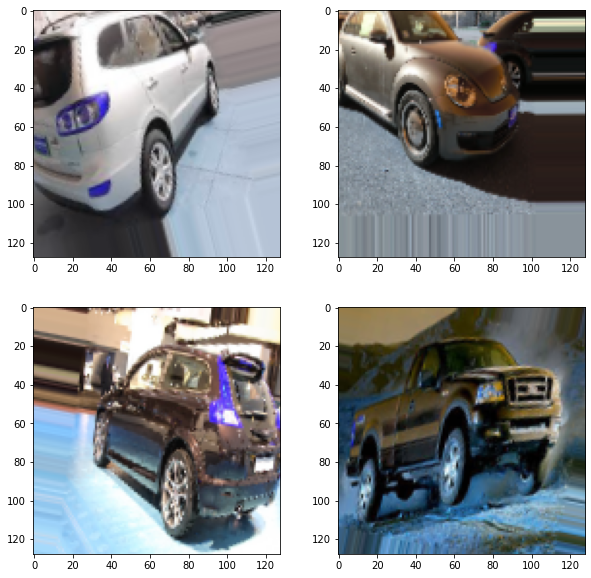

In [ ]:
f, axarr = plt.subplots(2,2,figsize =(10,10))
axarr[0,0].imshow(X_train_gen[20])
axarr[0,1].imshow(X_train_gen[600])
axarr[1,0].imshow(X_train_gen[2000])
axarr[1,1].imshow(X_train_gen[1000])

In [ ]:
X_train_final = np.vstack((X_train,X_train_gen))
y_train_final = np.vstack((y_train,y_train_gen))

In [ ]:
np.save(project_path +'X_train_final.npy', X_train_final)
np.save(project_path +'y_train_final.npy', y_train_final)

In [ ]:
# X_train_final= np.load(project_path + 'X_train_final.npy' ,allow_pickle=True)
# y_train_final= np.load(project_path + 'y_train_final.npy' ,allow_pickle=True)
train_gen_augmented = DataGenerator(np.load(project_path + 'X_train_final.npy' ,allow_pickle=True), np.load(project_path + 'y_train_final.npy' ,allow_pickle=True), 32)
test_gen_augmented = DataGenerator(X_test, y_test, 32)

In [ ]:
del X_test, y_test

### Applying model

In [ ]:
CNN_augmented_data_model = cnn_basic()

In [ ]:
# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode='min')

# Fit the model
CNN_classifier_augmented_data = CNN_augmented_data_model.fit(train_gen_augmented, batch_size=32, epochs=50, validation_data= test_gen_augmented, callbacks=[early_stop], verbose= 1)


Epoch 1/50
509/509 [==============================] - 12s 21ms/step - loss: 5.1906 - accuracy: 0.0149 - val_loss: 5.3195 - val_accuracy: 0.0088
Epoch 2/50
509/509 [==============================] - 11s 22ms/step - loss: 4.9770 - accuracy: 0.0262 - val_loss: 4.9360 - val_accuracy: 0.0284
Epoch 3/50
509/509 [==============================] - 11s 21ms/step - loss: 4.7497 - accuracy: 0.0400 - val_loss: 5.0073 - val_accuracy: 0.0225
Epoch 4/50
509/509 [==============================] - 12s 23ms/step - loss: 4.4497 - accuracy: 0.0629 - val_loss: 5.0500 - val_accuracy: 0.0361
Epoch 5/50
509/509 [==============================] - 11s 21ms/step - loss: 4.2021 - accuracy: 0.0879 - val_loss: 4.4487 - val_accuracy: 0.0800
Epoch 6/50
509/509 [==============================] - 11s 21ms/step - loss: 3.9351 - accuracy: 0.1171 - val_loss: 4.2641 - val_accuracy: 0.0862
Epoch 7/50
509/509 [==============================] - 11s 21ms/step - loss: 3.6608 - accuracy: 0.1497 - val_loss: 4.8144 - val_accuracy:

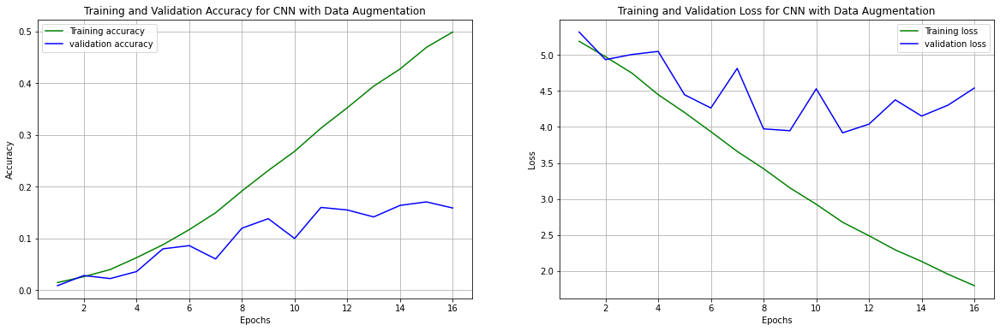

In [ ]:
# plot the train and validation accuracy with the number of epochs

plot_loss_accuracy(CNN_classifier_augmented_data,'CNN with Data Augmentation')

In [ ]:
CNN_augmented_data_model = tf.keras.models.load_model('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_augmented_data_model.h5')

In [ ]:
# prediction accuracy on Test data

y_train_pred = CNN_augmented_data_model.predict(X_train)
y_train_pred = np.argmax(y_train_pred,axis=1)  # predicted y_train converted back to label (earlier one hot encoded)

y_test_pred = CNN_augmented_data_model.predict(X_test)
y_test_pred = np.argmax(y_test_pred,axis=1)  # predicted y_test converted back to label (earlier one hot encoded)

y_train_true = np.argmax(y_train,axis=1)
y_test_true = np.argmax(y_test,axis=1)

#get Accuracy Score for train and test
cnn_data_augmented_accuracy_train = metrics.accuracy_score(y_train_true, y_train_pred)
cnn_data_augmented_accuracy_test = metrics.accuracy_score(y_test_true, y_test_pred)

In [ ]:
accuracy_scores_till_now = [cnn_vanilla_accuracy_train, cnn_vanilla_accuracy_test, cnn_pca_accuracy_train, cnn_pca_accuracy_test, cnn_hypertuned_accuracy_train, cnn_hypertuned_accuracy_test]

In [ ]:
# writing accuracies till now in a txt file
with open(r'/content/drive/My Drive/AIML/Capstone/accuracy_till_now.txt', 'w') as fp:
    for item in accuracy_scores_till_now:
        # write each item on a new line
        fp.write("%s\n" % item)
    print('Done')

Done


In [ ]:
del train_gen_augmented, test_gen_augmented

In [ ]:
# Save the entire model
CNN_augmented_data_model.save('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_augmented_data_model.h5')

# Save the weights
CNN_augmented_data_model.save_weights('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_augmented_data_weights.h5')

In [ ]:
del CNN_classifier_augmented_data, CNN_augmented_data_model, y_train_pred, y_test_pred, y_train_true, y_test_true

## 5. CNN with Transfer Learning (Resnet 50)

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

In [ ]:
batch_size = 32

test_datagen = ImageDataGenerator(preprocessing_function= preprocess_input,
                                  validation_split=0.3)

train_datagen = ImageDataGenerator(shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   preprocessing_function=preprocess_input)

train_ds = train_datagen.flow_from_directory(
              image_train_path, class_mode = 'categorical',
              subset="training", seed = 42,
              target_size=((224, 224)), batch_size=batch_size
)

val_ds = test_datagen.flow_from_directory(
            image_test_path, class_mode = 'categorical',
            subset="validation", seed = 42,
            target_size=((224, 224)), batch_size=batch_size)

Found 8144 images belonging to 196 classes.
Found 2317 images belonging to 196 classes.


In [ ]:
transform_test = ImageDataGenerator(preprocessing_function= preprocess_input)
test_ds = transform_test.flow_from_directory(
    image_test_path,
    seed = 42,target_size=(224, 224), batch_size=batch_size
)

Found 8041 images belonging to 196 classes.


In [ ]:
# Check the indices Image Data Generator has allotted to each folder
classes_dict = test_ds.class_indices
#print(classes_dict)

# Creating a list of classes in test set for showing the result as the folder name
prediction_class = []
for class_name,index in classes_dict.items():
  prediction_class.append(class_name)


### 1. Resnet50

In [ ]:
inputs = tf.keras.Input(shape=(224, 224, 3))
base_model = ResNet50(weights='imagenet', include_top=True, input_tensor=inputs)
last_layer = base_model.layers[-2].output
out = Dense(units = 196, activation = 'softmax', name = 'ouput')(last_layer)
new_base_model = Model(inputs = inputs, outputs = out)

for layer in new_base_model.layers[:-25]:
  layer.trainable = False

for i, layer in enumerate(new_base_model.layers):
    print(i, layer.name, layer.trainable)

102981632/102967424 [==============================] - 1s 0us/step
0 input_1 False
1 conv1_pad False
2 conv1_conv False
3 conv1_bn False
4 conv1_relu False
5 pool1_pad False
6 pool1_pool False
7 conv2_block1_1_conv False
8 conv2_block1_1_bn False
9 conv2_block1_1_relu False
10 conv2_block1_2_conv False
11 conv2_block1_2_bn False
12 conv2_block1_2_relu False
13 conv2_block1_0_conv False
14 conv2_block1_3_conv False
15 conv2_block1_0_bn False
16 conv2_block1_3_bn False
17 conv2_block1_add False
18 conv2_block1_out False
19 conv2_block2_1_conv False
20 conv2_block2_1_bn False
21 conv2_block2_1_relu False
22 conv2_block2_2_conv False
23 conv2_block2_2_bn False
24 conv2_block2_2_relu False
25 conv2_block2_3_conv False
26 conv2_block2_3_bn False
27 conv2_block2_add False
28 conv2_block2_out False
29 conv2_block3_1_conv False
30 conv2_block3_1_bn False
31 conv2_block3_1_relu False
32 conv2_block3_2_conv False
33 conv2_block3_2_bn False
34 conv2_block3_2_relu False
35 conv2_block3_3_conv False

In [ ]:
new_base_model.compile(optimizer=Adam(), loss="categorical_crossentropy",  metrics=['accuracy'])

early_stop = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 10)
lr_r = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 5)

CNN_transfer_learn_model = new_base_model.fit(train_ds, epochs=20, validation_data = val_ds, callbacks=[early_stop, lr_r])

Epoch 1/20
255/255 [==============================] - 983s 4s/step - loss: 1.9434 - accuracy: 0.4823 - val_loss: 2.1183 - val_accuracy: 0.4424 - lr: 0.0010
Epoch 2/20
255/255 [==============================] - 169s 661ms/step - loss: 1.0551 - accuracy: 0.7043 - val_loss: 1.7184 - val_accuracy: 0.5619 - lr: 0.0010
Epoch 3/20
255/255 [==============================] - 170s 668ms/step - loss: 0.6622 - accuracy: 0.8088 - val_loss: 1.7933 - val_accuracy: 0.5524 - lr: 0.0010
Epoch 4/20
255/255 [==============================] - 174s 680ms/step - loss: 0.4612 - accuracy: 0.8691 - val_loss: 1.5403 - val_accuracy: 0.6016 - lr: 0.0010
Epoch 5/20
255/255 [==============================] - 168s 657ms/step - loss: 0.3295 - accuracy: 0.9069 - val_loss: 1.5307 - val_accuracy: 0.6073 - lr: 0.0010
Epoch 6/20
255/255 [==============================] - 167s 653ms/step - loss: 0.2238 - accuracy: 0.9369 - val_loss: 1.6362 - val_accuracy: 0.6159 - lr: 0.0010
Epoch 7/20
255/255 [=============================

In [ ]:
# plot the train and validation accuracy with the number of epochs

plot_loss_accuracy(CNN_transfer_learn_model,'CNN with Transfer Learning')

In [ ]:
cnn_translearn_model = tf.keras.models.load_model('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_translearn_model.h5')

In [ ]:
#get Accuracy Score for train and test
# cnn_translearn_accuracy_train = CNN_transfer_learn_model.history.get('accuracy')[-1]
# cnn_translearn_accuracy_test = CNN_transfer_learn_model.history.get('val_accuracy')[-1]

cnn_translearn_accuracy_train = cnn_translearn_model.evaluate(train_ds)[1]
cnn_translearn_accuracy_test = cnn_translearn_model.evaluate(val_ds)[1]

73/73 [==============================] - 23s 319ms/step - loss: 1.1449 - accuracy: 0.7259


In [ ]:
# Save the entire model
new_base_model.save('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_translearn_model.h5')

# Save the weights
new_base_model.save_weights('/content/drive/My Drive/AIML/Capstone/Saved Models/CNN_translearn_weights.h5')

In [ ]:
# Prediction on images

def car_pred_show_img(train_or_test, num):
  if train_or_test =='train':
    print('Actual: {}'.format(train_data_final['Class Name'][num]))
    img_test = train_data_final['car_img_array_resized224X224'][num]

  elif train_or_test == 'test':
    print('Actual: {}'.format(test_data_final['Class Name'][num]))
    img_test = test_data_final['car_img_array_resized224X224'][num]
  else:
    print('Please enter "train" or "test" as the first argument')

  img_test_expanded = np.expand_dims(img_test, axis=0)
  img_test_processed = preprocess_input(img_test_expanded)
  pred_img = new_base_model.predict(img_test_processed)
  predicted_index = np.argmax(pred_img,axis=1)
  # Print the name of the class
  print('Predicted: {}'.format( prediction_class[predicted_index[0]]))
  plt.figure(figsize=(10,10))
  plt.imshow(img_test)
  plt.show()

Actual: Hyundai Sonata Hybrid Sedan 2012
Predicted: Hyundai Sonata Hybrid Sedan 2012


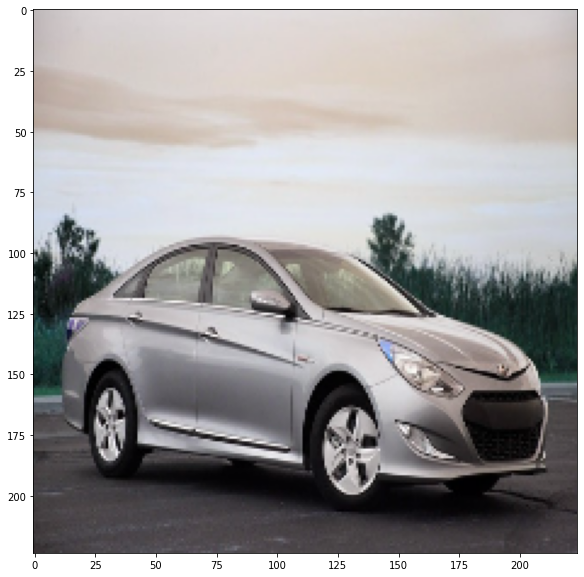

In [ ]:
car_pred_show_img('train',25)

Actual: Hyundai Genesis Sedan 2012
Predicted: Hyundai Genesis Sedan 2012


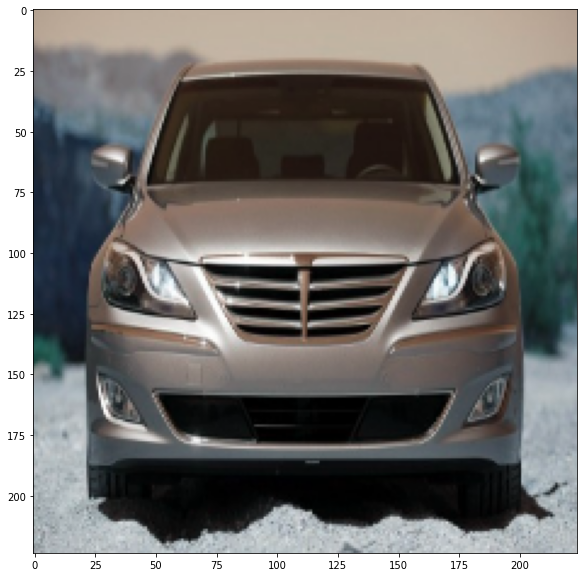

In [ ]:
car_pred_show_img('test',50)

Actual: Dodge Ram Pickup 3500 Crew Cab 2010
Predicted: Dodge Ram Pickup 3500 Crew Cab 2010


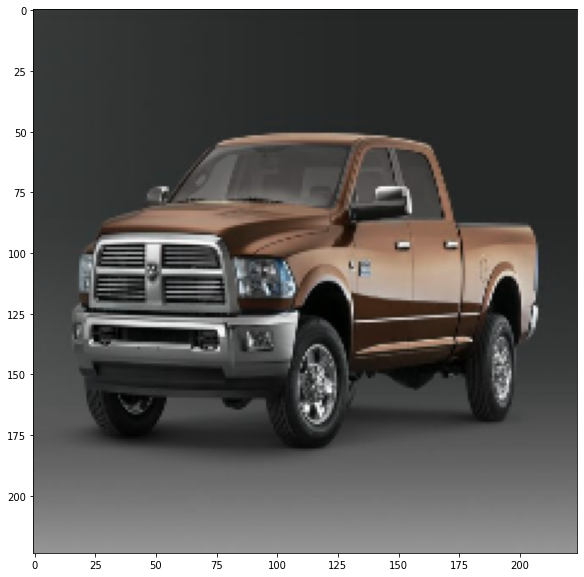

In [ ]:
car_pred_show_img('test',500)

## 6. Comparison of the models

In [ ]:
my_file = open("/content/drive/My Drive/AIML/Capstone/accuracy_till_now.txt", "r")
content = my_file.read()
accuracy_3 = content.split('\n')

cnn_vanilla_accuracy_train = float(accuracy_3[0])
cnn_vanilla_accuracy_test = float(accuracy_3[1])
cnn_pca_accuracy_train = float(accuracy_3[2])
cnn_pca_accuracy_test = float(accuracy_3[3])
cnn_hypertuned_accuracy_train = float(accuracy_3[4])
cnn_hypertuned_accuracy_test = float(accuracy_3[5])

In [ ]:
# final table showing accuracies of various models
df_comp = pd.DataFrame({'Classification Algorithm':
                        ['Vanilla CNN',
                         'CNN with PCA',
                         'Hyperparameter tuning of CNN',
                         'CNN with Data Augmentation',
                         'CNN with transfer learning'
                        ],

                        'Train Accuracy (%)':
                        [round(cnn_vanilla_accuracy_train*100,2),
                         round(cnn_pca_accuracy_train*100,2),
                         round(cnn_hypertuned_accuracy_train*100,2),
                         round(cnn_data_augmented_accuracy_train*100,2),
                         round(cnn_translearn_accuracy_train*100,2)
                        ],

                        'Test Accuracy (%)':
                        [round(cnn_vanilla_accuracy_test*100,2),
                         round(cnn_pca_accuracy_test*100,2),
                         round(cnn_hypertuned_accuracy_test*100,2),
                         round(cnn_data_augmented_accuracy_test*100,2),
                         round(cnn_translearn_accuracy_test*100,2)
                        ]})

print("Following table shows comparison of the image classification algorithms used in CNN: ")

df_comp

Following table shows comparison of the image classification algorithms used in CNN: 


,Classification Algorithm,Train Accuracy (%),Test Accuracy (%)
0,Vanilla CNN,35.50,11.16
1,CNN with PCA,15.13,6.24
2,Hyperparameter tuning of CNN,34.14,10.92
3,CNN with Data Augmentation,37.38,15.31
4,CNN with transfer learning,99.80,72.59


# Step 2: Design, train and test RCNN & its hybrids based object detection models to impose the bounding box or mask over the area of interest.

The final data taken is with augmentation since the accuracy increase by 6%.

### Model 1: RCNN

In [ ]:
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [ ]:
def get_iou(bb1, bb2):
    assert bb1['x0'] < bb1['x1']
    assert bb1['y0'] < bb1['y1']
    assert bb2['x0'] < bb2['x1']
    assert bb2['y0'] < bb2['y1']
    x_left = max(bb1['x0'], bb2['x0'])
    y_top = max(bb1['y0'], bb2['y0'])
    x_right = min(bb1['x1'], bb2['x1'])
    y_bottom = min(bb1['y1'], bb2['y1'])
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    bb1_area = (bb1['x1'] - bb1['x0']) * (bb1['y1'] - bb1['y0'])
    bb2_area = (bb2['x1'] - bb2['x0']) * (bb2['y1'] - bb2['y0'])
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

In [ ]:
from random import randrange

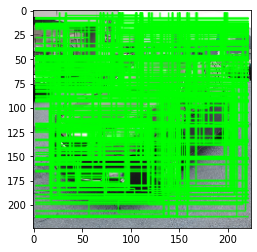

In [ ]:
im = train_data_final['car_img_array_resized224X224'][1]
ss.setBaseImage(im)
ss.switchToSelectiveSearchFast()
rects = ss.process()
imOut = im.copy()
for i, rect in (enumerate(rects)):
    x, y, w, h = rect
    cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
# plt.figure()
plt.imshow(imOut)

In [ ]:
rects[1]

array([180,  33,  44,  38], dtype=int32)

In [ ]:
train_images=[]
train_labels=[]
loop_value = 0
# bb_orig_img = pd.DataFrame(columns = ['x0','x1','y0','y1'])

for i in range(0,200):
  image_index = randrange(8000)
  image = train_data_final['car_img_array_resized224X224'][image_index]
  ss.setBaseImage(image)
  ss.switchToSelectiveSearchFast()
  ssresults = ss.process()
  imout = image.copy()
  # bb_orig_img.loc[0,'x0'] = train_data_final['x0_224'][image_index]
  # bb_orig_img.loc[0,'x1'] = train_data_final['x1_224'][image_index]
  # bb_orig_img.loc[0,'y0'] = train_data_final['y0_224'][image_index]
  # bb_orig_img.loc[0,'y1'] = train_data_final['y1_224'][image_index]

  # print (bb_orig_img)
  counter = 0
  falsecounter = 0
  flag = 0
  fflag = 0
  bflag = 0
  for e,result in enumerate(ssresults):
    if e < 2000 and flag == 0:
      x,y,w,h = result
      iou = get_iou({"x0":train_data_final['x0_224'][image_index],"x1":train_data_final['x1_224'][image_index],"y0":train_data_final['y0_224'][image_index],"y1":train_data_final['y1_224'][image_index]}
                    ,{"x0":x,"x1":x+w,"y0":y,"y1":y+h})
      if counter < 30:
          if iou > 0.70:
              timage = imout[y:y+h,x:x+w]
              resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
              train_images.append(resized)
              train_labels.append(1)
              counter += 1
      else :
          fflag =1
      if falsecounter <30:
          if iou < 0.3:
              timage = imout[y:y+h,x:x+w]
              resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
              train_images.append(resized)
              train_labels.append(0)
              falsecounter += 1
      else :
          bflag = 1
  if fflag == 1 and bflag == 1:
    loop_value = loop_value + 1
    print(loop_value)
    flag = 1

1
2
3
4


0


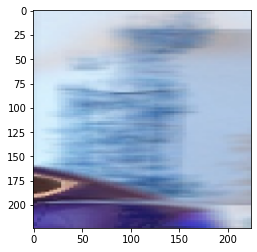

In [ ]:
# np.array(train_images).shape
plt.imshow(X_rcnn[3000])
print(y_rcnn[3000])

In [ ]:
train_data_final['x1_224'][image_index]

220

In [ ]:
X_rcnn = np.array(train_images)
y_rcnn = np.array(train_labels)

In [ ]:
del X_rcnn, y_rcnn, train_images, train_labels

In [ ]:
np.save(project_path +'X_rcnn.npy',X_rcnn)
np.save(project_path+'y_rcnn.npy',y_rcnn)

In [ ]:
ssresults[1]

array([ 79, 145,  15,  43], dtype=int32)

In [ ]:
from keras.applications.vgg16 import VGG16
from keras import Model
from sklearn.preprocessing import LabelBinarizer

In [ ]:
vggmodel = VGG16(weights='imagenet', include_top=True)
vggmodel.summary()

553476096/553467096 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
for layers in (vggmodel.layers)[:15]:
    print(layers)
    layers.trainable = False

X= vggmodel.layers[-2].output
predictions = Dense(2, activation="softmax")(X)

In [ ]:
model_final = Model(inputs = vggmodel.input, outputs = predictions)
opt = Adam(lr=0.0001)
model_final.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=["accuracy"])

In [ ]:
model_final.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
class MyLabelBinarizer(LabelBinarizer):
    def transform(self, y):
        Y = super().transform(y)
        if self.y_type_ == 'binary':
            return np.hstack((Y, 1-Y))
        else:
            return Y
    def inverse_transform(self, Y, threshold=None):
        if self.y_type_ == 'binary':
            return super().inverse_transform(Y[:, 0], threshold)
        else:
            return super().inverse_transform(Y, threshold)

In [ ]:
lenc = MyLabelBinarizer()
Y =  lenc.fit_transform(y_rcnn)

In [ ]:
Y[1]

array([0, 1])

In [ ]:
y_rcnn[1]

0

In [ ]:
X_train, X_test , y_train, y_test = train_test_split(X_rcnn,Y,test_size=0.15,random_state=40)

In [ ]:
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)


(7883, 224, 224, 3) (876, 224, 224, 3) (7883, 2) (876, 2)


In [ ]:
trdata = ImageDataGenerator(horizontal_flip=True, vertical_flip=True, rotation_range=90)
traindata = trdata.flow(x=X_train, y=y_train)
tsdata = ImageDataGenerator(horizontal_flip=True, vertical_flip=True, rotation_range=90)
testdata = tsdata.flow(x=X_test, y=y_test)

In [ ]:
checkpoint = ModelCheckpoint("ieeercnn_vgg16_1.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
early = EarlyStopping(monitor='val_accuracy', min_delta=0.01, patience=2, verbose=1, mode='auto')

In [ ]:
# hist = model_final.fit(generator= traindata, steps_per_epoch= 10, epochs= 50, validation_data= testdata, validation_steps=2, callbacks=[checkpoint,early])
hist = model_final.fit(X_train, y_train, batch_size=32, epochs=25, validation_data=(X_test, y_test), callbacks=[checkpoint, early], verbose= 1)


Epoch 1/25
233/233 [==============================] - ETA: 0s - loss: 2.6420e-09 - accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 1.00000, saving model to ieeercnn_vgg16_1.h5
233/233 [==============================] - 62s 266ms/step - loss: 2.6420e-09 - accuracy: 1.0000 - val_loss: 1.9316e-06 - val_accuracy: 1.0000
Epoch 2/25
233/233 [==============================] - ETA: 0s - loss: 2.3217e-09 - accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 1.00000
233/233 [==============================] - 55s 235ms/step - loss: 2.3217e-09 - accuracy: 1.0000 - val_loss: 1.7773e-06 - val_accuracy: 1.0000
Epoch 3/25
233/233 [==============================] - ETA: 0s - loss: 2.0495e-09 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 1.00000
233/233 [==============================] - 54s 233ms/step - loss: 2.0495e-09 - accuracy: 1.0000 - val_loss: 1.6513e-06 - val_accuracy: 1.0000
Epoch 3: early stopping


Got the bounding box with IOU>0.7
Got the bounding box with IOU>0.7
Got the bounding box with IOU>0.7
Got the bounding box with IOU>0.7
Got the bounding box with IOU>0.7


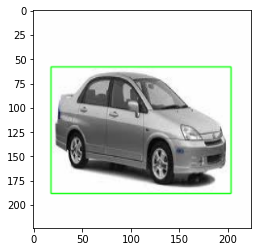

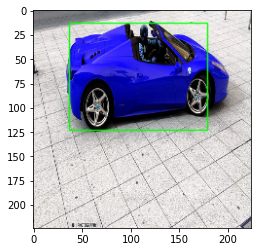

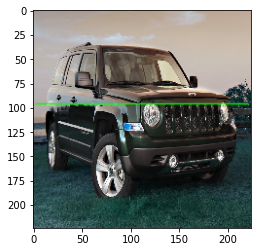

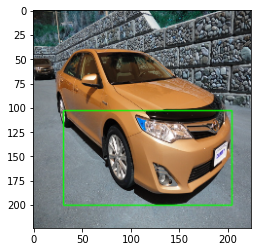

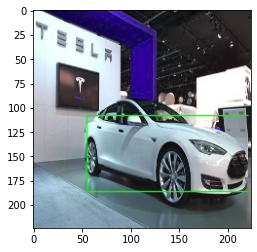

In [ ]:
for i in range(0,5):
  img_test = test_data_final['car_img_array_resized224X224'][i]
  ss.setBaseImage(img_test)
  ss.switchToSelectiveSearchFast()
  ssresults = ss.process()
  imout = img_test.copy()
  for e,result in enumerate(ssresults):
    if e < 2000:
        x,y,w,h = result
        timage = imout[y:y+h,x:x+w]
        resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
        img = np.expand_dims(resized, axis=0)
        out= model_final.predict(img)
        if out[0][0] > out[0][1]:
          cv2.rectangle(imout, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
          print('Got the bounding box with IOU>0.7')
          break
  plt.figure()
  plt.imshow(imout)

### Model 2: YOLO

YOLO which stands for “You only look once” is a single shot detection algorithm and it predicts classes and bounding boxes for the whole image in one run of the algorithm.

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2022-06-05 14:01:16--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights.1’

yolov3.weights.1    100%[===================>] 236.52M  23.4MB/s    in 11s     

2022-06-05 14:01:28 (21.7 MB/s) - ‘yolov3.weights.1’ saved [248007048/248007048]



To use YOLO via OpenCV, we need three files viz -’yoloV3.weights’, ‘yoloV3.cfg’ and “Classnames” ( contain all the names of the labels on which the model has been trained on).

In [ ]:
import cv2

# Load Yolo
print("LOADING YOLO")
net = cv2.dnn.readNet("yolov3.weights", "/content/darknet/cfg/yolov3.cfg")
#save all the names in file o the list classes
classes = []
with open("/content/drive/MyDrive/AIML/Capstone/ClassNames.txt", "r") as f:
    classes = [line.strip() for line in f.readlines()]
#get layers of the network
layer_names = net.getLayerNames()
#Determine the output layer names from the YOLO model
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
print("YOLO LOADED")

LOADING YOLO
YOLO LOADED


Build YOLO model:

Model predicts 4 coordinates for each bounding box (bx,by,bw,bh) with respect to the corresponding grid cell.

we are going to load the model using the function “cv2.dnn.ReadNet()”.This function loads the network into memory and automatically detects configuration and framework based on file name specified.

In [ ]:
from google.colab.patches import cv2_imshow

def Yolo_model(test_image):
# Capture frame-by-frame
  #img = cv2.imdecode(np.fromfile(test_image, dtype=np.uint8), cv2.IMREAD_UNCHANGED)
  img = cv2.imread(test_image,cv2.IMREAD_COLOR)
#     img = cv2.resize(img, None, fx=0.4, fy=0.4)
  height, width, channels = img.shape

    # USing blob function of opencv to preprocess image
  blob = cv2.dnn.blobFromImage(img, 1 / 255.0, (416, 416),
  swapRB=True, crop=False)
    #Detecting objects
  net.setInput(blob)
  outs = net.forward(output_layers)

    # Showing informations on the screen
  class_ids = []
  confidences = []
  boxes = []
  for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                  # Object detected
                  center_x = int(detection[0] * width)
                  center_y = int(detection[1] * height)
                  w = int(detection[2] * width)
                  h = int(detection[3] * height)

                  # Rectangle coordinates
                  x = int(center_x - w / 2)
                  y = int(center_y - h / 2)

                  boxes.append([x, y, w, h])
                  confidences.append(float(confidence))
                  class_ids.append(class_id)

    #We use NMS function in opencv to perform Non-maximum Suppression
    #we give it score threshold and nms threshold as arguments.
  indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
  colors = np.random.uniform(0, 255, size=(len(classes), 3))
  for i in range(len(boxes)):
          if i in indexes:
              x, y, w, h = boxes[i]
              label = str(classes[class_ids[i]])
              color = colors[class_ids[i]]
              cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
              #cv2.putText(img, label, (x, y -5),cv2.FONT_HERSHEY_SIMPLEX,1/2, color, 2)

  cv2_imshow(img)
  cv2.waitKey(0)

  return(class_ids,confidences,boxes)

Use built model for prediction on images

In [ ]:
def Yolo_predict(train_or_test,k):
  if train_or_test == 'train':
    print('Actual: {}'.format(train_data_final['Class Name'][k]))
    imgs_dir = image_train_path
    df_relevant = train_data_final.copy(deep=True)
  elif train_or_test == 'test':
    print('Actual: {}'.format(test_data_final['Class Name'][k]))
    imgs_dir = image_test_path
    df_relevant = test_data_final.copy(deep=True)
  else:
    print('Please enter "train" or "test" as the first argument')

  class_folder_path = os.path.join(imgs_dir, df_relevant['Class Name'][k])
  image_path = os.path.join(class_folder_path, df_relevant['Image Name'][k])

  # Reading an image in grayscale mode
  image_read = cv2.imread(image_path, cv2.IMREAD_COLOR)
  class_id,confidence,boxc = Yolo_model(image_path)
  print('Predicted Class Name:', class_id)
  print('Confidence :',confidence)
  print('Bounding box coordinates:',boxc)

Actual: Tesla Model S Sedan 2012


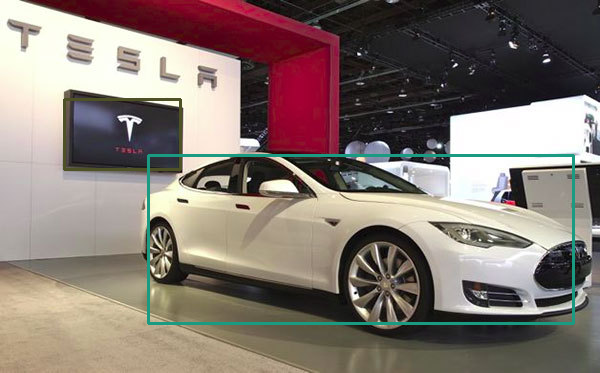

Predicted Class Name: [62, 2]
Confidence : [0.7739725708961487, 0.9944257140159607]
Bounding box coordinates: [[64, 99, 116, 70], [148, 155, 425, 168]]


In [ ]:
Yolo_predict('test',4)

Actual: Dodge Dakota Club Cab 2007


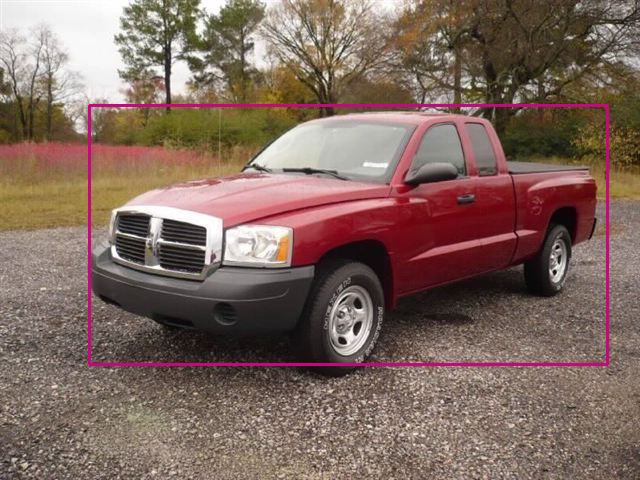

Predicted Class Name: [7]
Confidence : [0.9791545867919922]
Bounding box coordinates: [[89, 105, 518, 259]]


In [ ]:
Yolo_predict('train',2)

Actual: Hyundai Genesis Sedan 2012


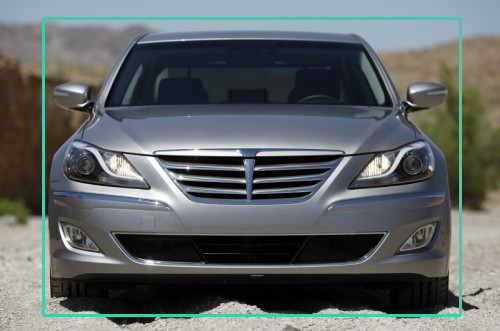

Predicted Class Name: [2]
Confidence : [0.920317530632019]
Bounding box coordinates: [[43, 18, 417, 297]]


In [ ]:
Yolo_predict('test',50)

Actual: Lamborghini Aventador Coupe 2012


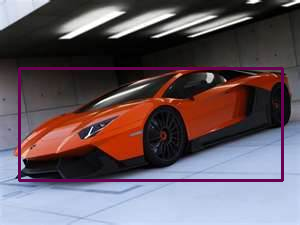

Predicted Class Name: [2]
Confidence : [0.8364014625549316]
Bounding box coordinates: [[19, 68, 263, 112]]


In [ ]:
Yolo_predict('test',20)

### Model 3: MobileNet

Load data mapping from saved file

In [ ]:
carNameDF= pd.read_csv(project_path +"Car names and make.csv",header=None)

class_names = []

with open(project_path +'Car names and make.csv') as csvDataFile:
    csvReader = csv.reader(csvDataFile, delimiter=';')
    for row in csvReader:

        class_names.append(row[0].replace('/', '-'))

Define Variables for Model ::

In [ ]:
img_height = 224
img_width = 224

aplpha = 1
BATCH_SIZE = 50

input_shape = (224, 224, 3)
n_classes=196

Lets use MobileNetV2 to create Bounding box model
Generate image and masks data for training images

In [ ]:
from tensorflow.keras.applications.mobilenet import preprocess_input

dataSize = train_data_final.shape[0]
dataSize

x_classes = []
x_data = []

x_masks = np.zeros((int(dataSize), img_height, img_width), dtype='float32')
x_data = np.zeros((int(dataSize), img_height, img_width, 3), dtype='float32')

for index in tqdm(range(dataSize)):

    #trainDataDF.shape[0]
    class_folder_path = os.path.join(image_train_path, train_data_final['Class Name'][index])
    image_path = os.path.join(class_folder_path, train_data_final['Image Name'][index])
    org_img_height = train_data_final['Image Height'][index]
    org_img_width = train_data_final['Image Length'][index]

    img = cv2.imread(image_path)
    img = cv2.resize(img, dsize=(img_height, img_width), interpolation=cv2.INTER_AREA)

    try:
        img = img[:, :, :3]
    except:
        continue
    x_data[index] = preprocess_input(np.array(img, dtype=np.float32))
    x_classes.append(train_data_final['Image class'][index])


    # Generate New x and y co-ordinates after resize the image
    x1 = int(train_data_final['x0'][index] * img_width / org_img_width)
    x2 = int(train_data_final['x1'][index] * img_width / org_img_width)
    y1 = int(train_data_final['y0'][index] * img_height / org_img_height)
    y2 = int(train_data_final['y1'][index] * img_height / org_img_height)

    x_masks[index][y1:y2, x1:x2] = 1.

100%|██████████| 8144/8144 [02:09<00:00, 63.09it/s]


In [ ]:
np.save(project_path+ 'x_masks.npy',x_masks)

In [ ]:
print(x_data.shape)
print(x_masks.shape)

(8144, 224, 224, 3)
(8144, 224, 224)


In [ ]:
random_seed = 2

x_train, x_test, y_train, y_test = train_test_split(x_data, x_masks, test_size = 0.3, random_state=random_seed)

In [ ]:
print(f"#### Shapes of Train, Test sets are: {x_train.shape},{x_test.shape}")
print(f"#### Shapes of Train, Test sets of Target are: {y_train.shape},{y_test.shape}")

#### Shapes of Train, Test sets are: (5700, 224, 224, 3),(2444, 224, 224, 3)
#### Shapes of Train, Test sets of Target are: (5700, 224, 224),(2444, 224, 224)


In [ ]:
train_steps = len(x_train)//BATCH_SIZE
valid_steps = len(x_test)//BATCH_SIZE

if len(x_train) % BATCH_SIZE != 0:
    train_steps += 1
if len(x_test) % BATCH_SIZE != 0:
    valid_steps += 1

In [ ]:
def create_model():
    inputs = Input(shape=(img_height, img_width, 3), name="input_image")

    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.35)

    skip_connection_names = ["input_image", "block_1_expand_relu", "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output

    f = [16, 32, 48, 64]
    x = encoder_output
    for i in range(1, len(skip_connection_names)+1, 1):
        x_skip = encoder.get_layer(skip_connection_names[-i]).output
        x = UpSampling2D((2, 2))(x)
        x = Concatenate()([x, x_skip])

        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

    x = Conv2D(1, (1, 1), padding="same")(x)
    x = Activation("sigmoid")(x)

    model = Model(inputs, x)
    return model

In [ ]:
smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [ ]:
mobvn_model = create_model()
mobvn_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  
                                )                                                             

In [ ]:
model_metrics = [Recall(), Precision()]
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

mobvn_model.compile(loss=dice_loss, optimizer = optimizer, metrics=model_metrics)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4),
    EarlyStopping(monitor='val_loss', patience=10, verbose = 1, restore_best_weights=False)
]

history_arr = mobvn_model.fit(  x_train, y_train, validation_data=(x_test, y_test),
                        epochs=25, steps_per_epoch=train_steps,
                        validation_steps=valid_steps,    callbacks=callbacks)

Epoch 1/25
114/114 [==============================] - 59s 372ms/step - loss: 0.1305 - recall: 0.9112 - precision: 0.9309 - val_loss: 0.2641 - val_recall: 0.9996 - val_precision: 0.5865 - lr: 0.0010
Epoch 2/25
114/114 [==============================] - 36s 318ms/step - loss: 0.0626 - recall: 0.9510 - precision: 0.9591 - val_loss: 0.1100 - val_recall: 0.9522 - val_precision: 0.8618 - lr: 0.0010
Epoch 3/25
114/114 [==============================] - 36s 317ms/step - loss: 0.0459 - recall: 0.9586 - precision: 0.9660 - val_loss: 0.0897 - val_recall: 0.9251 - val_precision: 0.9123 - lr: 0.0010
Epoch 4/25
114/114 [==============================] - 36s 317ms/step - loss: 0.0396 - recall: 0.9613 - precision: 0.9689 - val_loss: 0.0937 - val_recall: 0.9852 - val_precision: 0.8454 - lr: 0.0010
Epoch 5/25
114/114 [==============================] - 36s 317ms/step - loss: 0.0353 - recall: 0.9641 - precision: 0.9713 - val_loss: 0.0805 - val_recall: 0.9526 - val_precision: 0.8936 - lr: 0.0010
Epoch 6/25

Lets test the bounding box and masks on test data

In [ ]:
from skimage.segmentation import mark_boundaries
from skimage.measure import label, regionprops

def mobvn_predict(train_or_test,k):
  if train_or_test == 'train':
    print('Actual: {}'.format(train_data_final['Class Name'][k]))
    imgs_dir = image_train_path
    df_relevant = train_data_final.copy(deep=True)
  elif train_or_test == 'test':
    print('Actual: {}'.format(test_data_final['Class Name'][k]))
    imgs_dir = image_test_path
    df_relevant = test_data_final.copy(deep=True)
  else:
    print('Please enter "train" or "test" as the first argument')

  class_folder_path = os.path.join(imgs_dir, df_relevant['Class Name'][k])
  image_path = os.path.join(class_folder_path, df_relevant['Image Name'][k])

  # Reading an image in grayscale mode
  img_predict = cv2.imread(image_path, cv2.IMREAD_COLOR)
  img_predict = cv2.resize(img_predict,dsize=(img_width,img_height))
  print(img_predict.shape)
  feat_scaled = preprocess_input(np.array(img_predict, dtype=np.float32))

  y_pred = mobvn_model.predict(np.array([feat_scaled]))
  pred_mask = cv2.resize((1.0*(y_pred[0] > 0.5)), (img_width,img_height))


  lbl_0 = label(pred_mask)
  props = regionprops(lbl_0)

  img_1 = img_predict.copy()
  for prop in props:
    print('Found bbox', prop.bbox)
    cv2.rectangle(img_1, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (255, 0, 0), 2)

  #print(img_1)
  plt.imshow(img_1)

In [ ]:
mobvn_model.save('/content/drive/My Drive/AIML/Capstone/Saved Models/Mobilenet_model.h5')
mobvn_model.save_weights('/content/drive/My Drive/AIML/Capstone/Saved Models/Mobilenet_weights.h5')

In [ ]:
del train_data_final

Actual: Lamborghini Aventador Coupe 2012
(224, 224, 3)
Found bbox (59, 9, 182, 222)


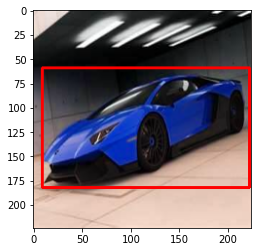

In [ ]:
mobvn_predict('test',20)

Actual: Tesla Model S Sedan 2012
(224, 224, 3)
Found bbox (29, 159, 40, 174)
Found bbox (33, 196, 40, 200)
Found bbox (40, 168, 55, 194)
Found bbox (55, 50, 205, 224)


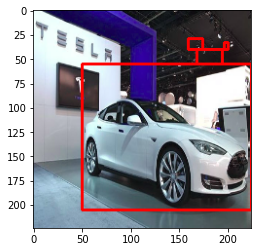

In [ ]:
mobvn_predict('test',4)

Actual: Hyundai Genesis Sedan 2012
(224, 224, 3)
Found bbox (20, 17, 213, 205)


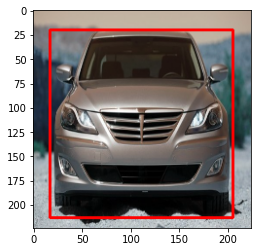

In [ ]:
mobvn_predict('test',50)

#### Step 1: Design a clickable UI which can automate tasks performed under milestone 1
#### Step 2: Design a clickable UI which can automate tasks performed under milestone 2
#### Step 3: Design a clickable UI based interface which can allow the user to browse & input the image, output the class and the bounding box or mask

#### Install Flask libs

In [ ]:
!pip install flask
!pip install flask-ngrok

!pip install pyngrok
!ngrok authtoken '29tXu2CWpYAF3O19S0NAJ3SOC4L_26CFgHzCWquGrL3bnBTx5'

In [ ]:
from flask import Flask, render_template, request
from flask_ngrok import run_with_ngrok

from flask import send_file
from keras.models import load_model
from keras.preprocessing import image
from tensorflow.keras.applications import resnet50, mobilenet, vgg16, inception_v3
import numpy as np
import pandas as pd
import csv
import cv2
import os
import json
from skimage.segmentation import mark_boundaries
from skimage.measure import label, regionprops

import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
%cd /content/drive/My Drive/Colab Notebooks/project_data/capstone-input/UI-code

In [ ]:
app = Flask(__name__, static_url_path='/static')
app.config['SEND_FILE_MAX_AGE_DEFAULT'] = 0
run_with_ngrok(app)  # Start ngrok when app is run

In [ ]:
@app.after_request
def add_header(response):
	response.headers['Cache-Control'] = 'no-store, no-cache, must-revalidate, post-check=0, pre-check=0, max-age=0'
	response.headers['Pragma'] = 'no-cache'
	response.headers['Expires'] = '-1'
	return response

smooth = 1e-15
def dice_coef(y_true, y_pred):
	y_true = tf.keras.layers.Flatten()(y_true)
	y_pred = tf.keras.layers.Flatten()(y_pred)
	intersection = tf.reduce_sum(y_true * y_pred)
	return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
	return 1.0 - dice_coef(y_true, y_pred)


model = load_model('car_resnet50_h5_model.h5')
boxModel = load_model('car_mobilenetV2_h5_model.h5', custom_objects={'dice_loss': dice_loss})

vggModel = load_model('car_vgg16_h5_model.h5')

cnnModel = load_model('CNN_augmented_data_model.h5')

#inceptionModel = inception_v3.InceptionV3()

#model.make_predict_function()

def predict_label(img_path):

	test_image = cv2.imread(img_path)
	test_image = cv2.resize(test_image,(224,224))

    #### If not compatible expand the dimensions to match with the Keras Input
	test_image = np.expand_dims(test_image, axis = 0)
	test_image = resnet50.preprocess_input(test_image.copy())

	result = model.predict(test_image)
	predicted_index = np.argmax(result[0])

	return predicted_index

def showBox(img_path):

	img_predict = cv2.imread(img_path)
	img_predict = cv2.resize(img_predict,(224,224))

	#### If not compatible expand the dimensions to match with the Keras Input
	feat_scaled = mobilenet.preprocess_input(np.array(img_predict, dtype=np.float32))
	y_pred = boxModel.predict(np.array([feat_scaled]))
	pred_mask = cv2.resize((1.0*(y_pred[0] > 0.5)), (224,224))

	lbl_0 = label(pred_mask)
	props = regionprops(lbl_0)

	img_1 = img_predict.copy()
	for prop in props:
		print('Found bbox', prop.bbox)
		cv2.rectangle(img_predict, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (255, 0, 0), 2)


	return img_predict



# routes
@app.route("/", methods=['GET', 'POST'])
def main_class():
	return render_template("index.html")

@app.route("/eda", methods=['GET', 'POST'])
def create_eda():

	trainDataDF = pd.read_csv("trainDataDF_test.csv")
	testDataDF = pd.read_csv("testDataDF_test.csv")

	brandDF_train = trainDataDF.groupby(['Car Make']).size().reset_index()
	brandDF_train.rename(columns={0:'brand_count'}, inplace=True)

	brandDF_test = trainDataDF.groupby(['Car Make']).size().reset_index()
	brandDF_test.rename(columns={0:'brand_count'}, inplace=True)

	fig = px.bar(brandDF_train, x='Car Make', y='brand_count', color='brand_count',
             labels={  "classCounts": "count" }, width=1000, height=500)
	fig.update_layout(title={'text': 'Train Data Brand Vs Number of images', 'y':0.95,'x':0.5 })

	graph_1_JSON = json.dumps(fig, cls=plotly.utils.PlotlyJSONEncoder)

	fig_2 = px.pie(brandDF_train, values='brand_count', names='Car Make', width=1000, height=800)
	graph_2_JSON = json.dumps(fig_2, cls=plotly.utils.PlotlyJSONEncoder)

#### Create Graph 3
	train_CarTypeClass = trainDataDF['Car Type'].value_counts().sort_index().index.tolist()

	trainDataArr = []
	testDataArr = []
	for colName in train_CarTypeClass:

		trainDataArr.append( (trainDataDF['Car Type'] == colName).sum() )
		testDataArr.append( (testDataDF['Car Type'] == colName).sum() )

		fig_3 = go.Figure()
		fig_3.add_trace(go.Bar(x=train_CarTypeClass,
                y=trainDataArr,  name='Train Data',
                #marker_color='rgb(55, 83, 109)'
                ))
		fig_3.add_trace(go.Bar(x=train_CarTypeClass,
                y=testDataArr, name='Test Data',
                #marker_color='rgb(26, 118, 255)'

                ))

		fig_3.update_layout(
    	title='Count distribution of Car Type', width=1100, height=600,
    	xaxis_tickfont_size=14, 	barmode='group',
    	bargap=0.15, # gap between bars of adjacent location coordinates.
    	bargroupgap=0.1 # gap between bars of the same location coordinate.
		)
		graph_3_JSON = json.dumps(fig_3, cls=plotly.utils.PlotlyJSONEncoder)


#### Create graph 4

	trainCarMake = trainDataDF['Car Make'].value_counts().sort_index().index.tolist()
	trainDataArr = []
	testDataArr = []
	for colName in trainCarMake:

		trainDataArr.append( (trainDataDF['Car Make'] == colName).sum() )
		testDataArr.append( (testDataDF['Car Make'] == colName).sum() )

		fig_4 = go.Figure()
		fig_4.add_trace(go.Bar(x=trainCarMake, y=trainDataArr,
                name='Train Data',
                marker_color='rgb(55, 83, 109)'
                ))
		fig_4.add_trace(go.Bar(x=trainCarMake, y=testDataArr,
                name='Test Data',
                marker_color='rgb(26, 118, 255)'
                ))

		fig_4.update_layout(
    	title='Count distribution of Car Make', width=1100, height=600,
    	xaxis_tickfont_size=14,
    	barmode='group',
    	bargap=0.15, # gap between bars of adjacent location coordinates.
    	bargroupgap=0.1 # gap between bars of the same location coordinate.
		)

		graph_4_JSON = json.dumps(fig_4, cls=plotly.utils.PlotlyJSONEncoder)


	CarMakevsType_train = trainDataDF.groupby(['Car Make','Car Type']).size().reset_index()
	CarMakevsType_train.rename(columns={0:'brand_count'}, inplace=True)
	fig_5 = px.bar(CarMakevsType_train, x="Car Make", y="brand_count", color="Car Type", title="Model count chart for train data", width=1000, height=700)
	graph_5_JSON = json.dumps(fig_5, cls=plotly.utils.PlotlyJSONEncoder)

	CarMakevsType_test = testDataDF.groupby(['Car Make','Car Type']).size().reset_index()
	CarMakevsType_test.rename(columns={0:'brand_count'}, inplace=True)
	fig_6 = px.bar(CarMakevsType_test, x="Car Make", y="brand_count", color="Car Type", title="Model count chart for test data", width=1000, height=700)
	graph_6_JSON = json.dumps(fig_6, cls=plotly.utils.PlotlyJSONEncoder)

	fig_7 = px.scatter_3d(trainDataDF, x='Car Type', y='Car Make', z='Year of Manufacturing', color='Year of Manufacturing')
	fig_7.update_layout(height=700, width=1100)
	graph_7_JSON = json.dumps(fig_7, cls=plotly.utils.PlotlyJSONEncoder)

	fig_8 = px.scatter_3d(testDataDF, x='Car Type', y='Car Make', z='Year of Manufacturing', color='Year of Manufacturing')
	fig_8.update_layout(height=700, width=1100)
	graph_8_JSON = json.dumps(fig_8, cls=plotly.utils.PlotlyJSONEncoder)

	return render_template("eda.html", graph_1_JSON=graph_1_JSON, graph_2_JSON=graph_2_JSON,
	                       graph_3_JSON=graph_3_JSON, graph_4_JSON=graph_4_JSON,
												 graph_5_JSON=graph_5_JSON, graph_6_JSON=graph_6_JSON,
												 graph_7_JSON=graph_7_JSON, graph_8_JSON=graph_8_JSON)


@app.route("/submit", methods = ['GET', 'POST'])
def get_output():
	if request.method == 'POST':

		predImgPath = os.path.join("static/pred_img.jpg")
		if(os.path.isfile(predImgPath)):
			os.remove(predImgPath)


		img = request.files['my_image']

		img_path = "static/" + img.filename
		img.save(img_path)

		predicted_index = predict_label(img_path)
		predBox = showBox(img_path)
		predBox_img = image.array_to_img(predBox)

		print(predImgPath)

		image.save_img(predImgPath, predBox_img)



		prediction_class = []
		with open('car_classes.csv') as csvDataFile:
			csvReader = csv.reader(csvDataFile, delimiter=';')
			for row in csvReader:
				prediction_class.append(row[0].replace('/', '-'))


		resnetName = prediction_class[predicted_index]



	return render_template("index.html", prediction = resnetName, img_path = img_path, img_box = predImgPath)


def predict_CNN_label(img_path):

	test_image = cv2.imread(img_path)
	test_image = cv2.resize(test_image,(224,224))

    #### If not compatible expand the dimensions to match with the Keras Input
	test_image = np.expand_dims(test_image, axis = 0)

	result = vggModel.predict(test_image)

	predicted_index = np.argmax(result[0])

	return predicted_index

### Vgg16

def predict_vgg16_label(img_path):

	test_image = cv2.imread(img_path)
	test_image = cv2.resize(test_image,(224,224))

    #### If not compatible expand the dimensions to match with the Keras Input
	test_image = np.expand_dims(test_image, axis = 0)
	test_image = vgg16.preprocess_input(test_image.copy())

	result = vggModel.predict(test_image)
	predicted_index = np.argmax(result[0])

	return predicted_index

### Model Testing
@app.route("/check_model", methods=['GET', 'POST'])
def modelCheck_class():
	return render_template("model_check.html")

@app.route("/submit_model", methods = ['GET', 'POST'])
def get_model_output():
	if request.method == 'POST':

		predImgPath = os.path.join("static/pred_img.jpg")
		if(os.path.isfile(predImgPath)):
			os.remove(predImgPath)


		img = request.files['my_image']

		img_path = "static/" + img.filename
		img.save(img_path)

		predicted_index = predict_label(img_path)
		vgg_index = predict_vgg16_label(img_path)
		cnn_index = predict_CNN_label(img_path)

		prediction_class = []
		with open('car_classes.csv') as csvDataFile:
			csvReader = csv.reader(csvDataFile, delimiter=';')
			for row in csvReader:
				prediction_class.append(row[0].replace('/', '-'))


		pName = prediction_class[predicted_index]
		vggName = prediction_class[vgg_index]
		cnnName = prediction_class[cnn_index]



	return render_template("model_check.html", prediction = pName, vggName = vggName, cnnName=cnnName,  img_path = img_path)




#### Lets Run the WebApp using Flask + ngrok

In [ ]:
if __name__ == '__main__':
	app.run()

# If address is in use, may need to terminate other sessions:
# Runtime > Manage Sessions > Terminate Other Sessions

# ----------------- END -------------------------